<a href="https://colab.research.google.com/github/ViniciusBortolini/TCC/blob/main/COVID_19_Tratamento_Dados_tcc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1 Montando Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd

# 2 Importando dataset de pacientes

In [ ]:
import pandas as pd

dfpac = pd.read_csv("/content/drive/MyDrive/TCC/EINSTEIN_Pacientes_2.csv", sep='|')
dfpac.shape

(79863, 7)

In [ ]:
dfpac.drop_duplicates(inplace=True)
dfpac.shape

(79863, 7)

# 3 Importando dataset de exames

In [ ]:
import pandas as pd 

dfexm = pd.read_csv('/content/drive/MyDrive/TCC/EINSTEIN_Exames_2.csv', sep='|')
dfexm.shape

(3415155, 8)

In [ ]:
dfexm.drop_duplicates(inplace=True)
dfexm.shape

(3414087, 8)

# 4 Mostrando o início de cada dataset


In [ ]:
dfpac.head()

,ID_PACIENTE,IC_SEXO,AA_NASCIMENTO,CD_UF,CD_MUNICIPIO,CD_CEPREDUZIDO,CD_PAIS
0,13d016bccfdd1b92039607f025f9dd87a03c3bcb,M,1961,SP,SAO PAULO,CCCC,BR
1,dd3867bd301ef64a20e8a4f62b661ecea83c3a64,M,1980,SP,CARAPICUIBA,CCCC,BR
2,08b0c43e08784fe685588a6fec4425c2e3a6f136,M,1959,SP,SAO PAULO,CCCC,BR
3,8106880fb080a34ae9ef20a64884e8a1a8772c68,F,1971,SP,SAO PAULO,CCCC,BR
4,dd02af1a979c3b31010fe39be0bc9f3380f29047,F,1982,SP,MMMM,CCCC,BR


In [ ]:
dfexm.head()

,ID_PACIENTE,DT_COLETA,DE_ORIGEM,DE_EXAME,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,DE_VALOR_REFERENCIA
0,00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Dosagem de D-Dímero,D-Dímero,863,ng/mL FEU,<=500
1,00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Hemograma com Plaquetas,RDW,13.0,%,11.5 a 16.5
2,00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Dosagem de Sódio,Sódio,134,mEq/L,135 a 145
3,00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Hemograma Contagem Auto,Eosinófilos,1.3,%,NaN
4,00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Dosagem de Uréia,Uréia,24,mg/dL,17 a 49


# 5 Descrevendo os dados

In [ ]:
dfpac.describe()

,ID_PACIENTE,IC_SEXO,AA_NASCIMENTO,CD_UF,CD_MUNICIPIO,CD_CEPREDUZIDO,CD_PAIS
count,79863,79863,79863,79863,79863,79863,79863
unique,79863,2,91,4,43,63,1
top,80f5f00071588b85bb80e44a20526a559b07ee5a,F,1981,SP,SAO PAULO,CCCC,BR
freq,1,40911,2545,78921,58800,76386,79863


In [ ]:
dfexm.describe()

,ID_PACIENTE,DT_COLETA,DE_ORIGEM,DE_EXAME,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,DE_VALOR_REFERENCIA
count,3414087,3414087,3414087,3414087,3414087,3414087,2745351,2662028
unique,79840,285,1,63,126,27631,18,307
top,d5aef7e019e21e760b0a88f6a97526de6496a58f,10/06/2020,HOSP,Hemograma com Plaquetas,Resultado COVID-19:,Não detectado,%,Não detectado
freq,10271,22434,3414087,867493,106206,175174,686677,197717


# 6 Mais informações sobre os dados

In [ ]:
dfpac.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79863 entries, 0 to 79862
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ID_PACIENTE     79863 non-null  object
 1   IC_SEXO         79863 non-null  object
 2   AA_NASCIMENTO   79863 non-null  object
 3   CD_UF           79863 non-null  object
 4   CD_MUNICIPIO    79863 non-null  object
 5   CD_CEPREDUZIDO  79863 non-null  object
 6   CD_PAIS         79863 non-null  object
dtypes: object(7)
memory usage: 4.9+ MB


In [ ]:
dfexm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3414087 entries, 0 to 3415154
Data columns (total 8 columns):
 #   Column               Dtype 
---  ------               ----- 
 0   ID_PACIENTE          object
 1   DT_COLETA            object
 2   DE_ORIGEM            object
 3   DE_EXAME             object
 4   DE_ANALITO           object
 5   DE_RESULTADO         object
 6   CD_UNIDADE           object
 7   DE_VALOR_REFERENCIA  object
dtypes: object(8)
memory usage: 234.4+ MB


# 7 Verificando existencia exames duplicados

In [ ]:
dfdup = dfexm[dfexm.duplicated(keep=False)]

dfdup

,ID_PACIENTE,DT_COLETA,DE_ORIGEM,DE_EXAME,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,DE_VALOR_REFERENCIA


# 8 Verificando a existencia de índices duplicados

In [ ]:
#ORIGINAL dfdupi = dfexm.set_index(keys=['ID_PACIENTE', 'DT_COLETA'])[~dfexm.index.duplicated(keep='first')]
dfdupi = dfexm.set_index(keys=['ID_PACIENTE'])[~dfexm.index.duplicated(keep='first')]

dfdupi

,DT_COLETA,DE_ORIGEM,DE_EXAME,DE_ANALITO,DE_RESULTADO,CD_UNIDADE,DE_VALOR_REFERENCIA
ID_PACIENTE,,,,,,,
00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Dosagem de D-Dímero,D-Dímero,863,ng/mL FEU,<=500
00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Hemograma com Plaquetas,RDW,13.0,%,11.5 a 16.5
00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Dosagem de Sódio,Sódio,134,mEq/L,135 a 145
00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Hemograma Contagem Auto,Eosinófilos,1.3,%,NaN
00006490d57666d73747c29c01079b60b1353002,04/06/2020,HOSP,Dosagem de Uréia,Uréia,24,mg/dL,17 a 49
...,...,...,...,...,...,...,...
fffe5deaaa04df733d7453bfaff1d55b8a397575,12/03/2020,HOSP,Hemograma com Plaquetas,Hematócrito,41.4,%,39.0 a 50.0
fffe5deaaa04df733d7453bfaff1d55b8a397575,29/04/2020,HOSP,PCR em tempo real para detecção de Coron,Resultado COVID-19:,Não detectado,NaN,Não detectado
fffe5deaaa04df733d7453bfaff1d55b8a397575,29/04/2020,HOSP,Sorologia SARS-CoV-2/COVID19 IgG/IgM,"IgM, COVID19",0.26,AU/ml,<=0.90


# 9 Removendo exames sem resultado

In [ ]:
#dfexm.dropna(inplace=True)

# 10 Verificando quantidade de exames

In [ ]:
from numpy import savetxt

dfexm1 = dfexm[['ID_PACIENTE', 'DT_COLETA', 'DE_EXAME', 'DE_ANALITO', 'DE_RESULTADO', 'CD_UNIDADE']]

tmp = dfexm1.assign(EXAME = dfexm1['DE_EXAME'].astype(str) + '/' + dfexm1['DE_ANALITO'].astype(str)).drop(columns=['DE_EXAME', 'DE_ANALITO'])
tmp1 = tmp['EXAME'].unique()

for e in tmp1:
  print(e)

Dosagem de D-Dímero/D-Dímero
Hemograma com Plaquetas/RDW
Dosagem de Sódio/Sódio
Hemograma Contagem Auto/Eosinófilos
Dosagem de Uréia/Uréia
Hemograma Contagem Auto/Basófilos
Hemograma com Plaquetas/Volume Médio Plaquetário
Hemograma com Plaquetas/Hematócrito
Hemograma com Plaquetas/Hemácias
Hemograma com Plaquetas/Hemoglobina
Hemograma Contagem Auto/Linfócitos
Hemograma com Plaquetas/Plaquetas
Hemograma com Plaquetas/CHCM
Hemograma Contagem Auto/Eosinófilos  #
Dosagem de Potássio/Potássio
Hemograma Contagem Auto/Linfócitos #
Hemograma Contagem Auto/Neutrófilos
Hemograma com Plaquetas/VCM
Hemograma com Plaquetas/Leucócitos #
Hemograma com Plaquetas/Leucócitos
Hemograma Contagem Auto/Neutrófilos  #
Hemograma Contagem Auto/Monócitos #
Hemograma Contagem Auto/Monócitos
Dosagem de CreatiNINA/Creatinina
Hemograma Contagem Auto/Basófilos #
Hemograma com Plaquetas/HCM
PCR em tempo real para detecção de Coron/Resultado COVID-19:
Gasometria Arterial/ctO2 (gasometria arterial)
Gasometria Arterial/

In [ ]:
tmp.head()

,ID_PACIENTE,DT_COLETA,DE_RESULTADO,CD_UNIDADE,EXAME
0,00006490d57666d73747c29c01079b60b1353002,04/06/2020,863,ng/mL FEU,Dosagem de D-Dímero/D-Dímero
1,00006490d57666d73747c29c01079b60b1353002,04/06/2020,13.0,%,Hemograma com Plaquetas/RDW
2,00006490d57666d73747c29c01079b60b1353002,04/06/2020,134,mEq/L,Dosagem de Sódio/Sódio
3,00006490d57666d73747c29c01079b60b1353002,04/06/2020,1.3,%,Hemograma Contagem Auto/Eosinófilos
4,00006490d57666d73747c29c01079b60b1353002,04/06/2020,24,mg/dL,Dosagem de Uréia/Uréia


# 11 Organizando dados dos exames

In [ ]:
dfexm2 = dfexm1.assign(EXAME = dfexm1['DE_EXAME'].astype(str) + '/' + dfexm1['DE_ANALITO'].astype(str)).drop(columns=['DE_EXAME', 'DE_ANALITO'])
#dfexm3 = dfexm2.assign(RESULTADO = dfexm1['DE_RESULTADO'].astype(str)) #+ ' ' + dfexm1['CD_UNIDADE'].astype(str)).drop(columns=['DE_RESULTADO', 'CD_UNIDADE'])

#ORIGINAL dfexm4 = dfexm2.set_index(keys=['ID_PACIENTE', 'DT_COLETA', 'EXAME'])
dfexm4 = dfexm2.set_index(keys=['ID_PACIENTE', 'EXAME'])

#TESTE PARA CONVERTER EM DATATIME dfexm4 = dfexm4.assign(NovaData = dfexm4['DE_EXAME'].astype(datetime))

#dfexm3 = dfexm2.head(100).pivot_table(index=['ID_PACIENTE', 'DT_COLETA'], columns='EXAME', values='DE_RESULTADO')
#dfexm3 = dfexm2.head(150).set_index(['ID_PACIENTE', 'DT_COLETA', 'EXAME']).unstack('EXAME')
#dfexm4 = dfexm3.reset_index().head(200).pivot(index=['ID_PACIENTE', 'DT_COLETA'], columns='EXAME', values='DE_RESULTADO')

#dfexm6 = dfexm5[dfexm5.index.duplicated(keep='first')]
dfexm5 = dfexm4[~dfexm4.index.duplicated(keep='first')]


In [ ]:
dfexm4.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 3414087 entries, ('00006490d57666d73747c29c01079b60b1353002', 'Dosagem de D-Dímero/D-Dímero') to ('ffff926827c98a8f3270841a43f4e2bc3269bbf1', 'PCR em tempo real para detecção de Coron/Resultado COVID-19:')
Data columns (total 3 columns):
 #   Column        Dtype 
---  ------        ----- 
 0   DT_COLETA     object
 1   DE_RESULTADO  object
 2   CD_UNIDADE    object
dtypes: object(3)
memory usage: 100.8+ MB


In [ ]:
dfexm5.head()

DT_COLETA  ... CD_UNIDADE
ID_PACIENTE                              EXAME                                            ...           
00006490d57666d73747c29c01079b60b1353002 Dosagem de D-Dímero/D-Dímero         04/06/2020  ...  ng/mL FEU
                                         Hemograma com Plaquetas/RDW          04/06/2020  ...          %
                                         Dosagem de Sódio/Sódio               04/06/2020  ...      mEq/L
                                         Hemograma Contagem Auto/Eosinófilos  04/06/2020  ...          %
                                         Dosagem de Uréia/Uréia               04/06/2020  ...      mg/dL

[5 rows x 3 columns]

# 12 Exportando exames
Apenas a importação total que não deu certo devido ao tamanho de dados

In [ ]:
dfexm6 = dfexm5.reset_index().head(100000).pivot(['ID_PACIENTE', 'DT_COLETA'], columns='EXAME', values='DE_RESULTADO')
#//dfexm6 = dfexm5.reset_index().head(100000).pivot(index=['ID_PACIENTE'], columns=['EXAME'], values='DE_RESULTADO')
#dfexm6 = dfexm5.assign(DATA = dfexm5['DT_COLETA'])
dfexm6.to_csv('/content/drive/MyDrive/TCC/DadosTratados_100.csv')

dfexmf = dfexm5.reset_index().pivot(index=['ID_PACIENTE', 'DT_COLETA'], columns='EXAME', values='DE_RESULTADO')
dfexmf.to_csv('/content/drive/MyDrive/TCC/DadosTratados_full.csv')

dfexm6.shape

(10014, 202)

# 13 Tratando dados


In [ ]:
dfexm6

EXAME                                               Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr  ... Urina Tipo I/pH
ID_PACIENTE                              DT_COLETA                                                            ...                
00006490d57666d73747c29c01079b60b1353002 04/06/2020                                                NaN        ...             NaN
                                         05/06/2020                                                NaN        ...             NaN
                                         24/05/2020                                                NaN        ...             NaN
00011583dd847df7a6d6a98e2110f9a69396f2ad 27/07/2020                                                NaN        ...             NaN
00012e05d80f5884023c3b6eaa3294e41d7c58bc 24/07/2020                                                NaN        ...             NaN
...                                                                                                ...        ...             ...
135676d1553a65d0e533de02e81bc645347fc2c7 04/06/2020                                                NaN        ...             NaN
1356e706cf93c44810396e4869745a09a208d4db 12/04/2020                                                NaN        ...             NaN
1357e8f40643c9cbb35fd3123969344ca6c32800 13/03/2020                                                NaN        ...             NaN
                                         15/11/2019                                                NaN        ...             NaN
1358d279fadf1e015ba7aa870fbf840c6654d528 16/06/2020                                                NaN        ...             NaN

[10014 rows x 202 columns]

## 13.1 Verificando quais colunas possuem mais dados faltantes


In [ ]:
dicionario = {}
for i in dfexm6.columns:
  dicionario[i] = dfexm6[i].isna().sum() / dfexm6.shape[0]
sorted(dicionario.items(), reverse= False, key= lambda x: x[1])  

[('PCR em tempo real para detecção de Coron/Resultado COVID-19:',
  0.3812662272818055),
 ('Hemograma com Plaquetas/CHCM', 0.8255442380667066),
 ('Hemograma com Plaquetas/HCM', 0.8255442380667066),
 ('Hemograma com Plaquetas/Hematócrito', 0.8255442380667066),
 ('Hemograma com Plaquetas/Hemoglobina', 0.8255442380667066),
 ('Hemograma com Plaquetas/Hemácias', 0.8255442380667066),
 ('Hemograma com Plaquetas/Leucócitos', 0.8255442380667066),
 ('Hemograma com Plaquetas/Leucócitos #', 0.8255442380667066),
 ('Hemograma com Plaquetas/Plaquetas', 0.8255442380667066),
 ('Hemograma com Plaquetas/VCM', 0.8255442380667066),
 ('Hemograma com Plaquetas/RDW', 0.8256440982624326),
 ('Hemograma com Plaquetas/Volume Médio Plaquetário', 0.8262432594367884),
 ('Hemograma Contagem Auto/Eosinófilos', 0.8349310964649491),
 ('Hemograma Contagem Auto/Basófilos', 0.8350309566606751),
 ('Hemograma Contagem Auto/Basófilos #', 0.8350309566606751),
 ('Hemograma Contagem Auto/Eosinófilos  #', 0.8350309566606751),
 ('

## 13.2 Verificando as linhas que mais possuem dados faltantes

In [ ]:
dicionario = {}
for i, valor in dfexm6.iterrows():
  dicionario[i] = valor.isna().sum() / dfexm6.shape[1]
sorted(dicionario.items(), reverse= False, key= lambda x: x[1]) 

[(('05326940bf31e95b47afb541acf15726e2eb70bd', '13/05/2020'),
  0.47029702970297027),
 (('0723c9ced8beda672c0560d1e33367e4ba76d9a5', '16/06/2020'),
  0.5297029702970297),
 (('101247a9e83903b58baa2f64dda12d2cc44d4a5d', '09/04/2020'),
  0.5643564356435643),
 (('03ffc6c46d4a00471142cd543f550adabd25f32d', '10/07/2020'),
  0.6039603960396039),
 (('04b4618339eabf0084a226b0ae1a4ebae051b90e', '13/04/2020'),
  0.6089108910891089),
 (('102bd25e84e6fa3b89f904ecb264da4fdc1e4a3c', '24/03/2020'),
  0.6089108910891089),
 (('05c5ffbc1e5482c4991602345299f7a3f7070b64', '26/05/2020'),
  0.6138613861386139),
 (('0aa7f723ea9c45f4498649544bb11f4ff8bd5f24', '20/07/2020'),
  0.6138613861386139),
 (('0379a1f6441bfbed6c7f081f706f17c44ad43b8d', '01/06/2020'),
  0.6188118811881188),
 (('084215d56e08226bee52390e15845d1a80bf929d', '15/05/2020'),
  0.6188118811881188),
 (('0d923e2b4d838e8b91ee20429db0b1ba1fc39166', '07/07/2020'),
  0.6188118811881188),
 (('105bd39d73ecb33a166ed229bfa3c58e3ad95724', '22/05/2020'),
  

## 13.3 Converter DT_COLETA de String para Data

In [ ]:
dfexm6.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 10014 entries, ('00006490d57666d73747c29c01079b60b1353002', '04/06/2020') to ('1358d279fadf1e015ba7aa870fbf840c6654d528', '16/06/2020')
Columns: 202 entries, Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr to Urina Tipo I/pH
dtypes: object(202)
memory usage: 15.7+ MB


In [ ]:
from datetime import datetime
dfexm7 = dfexmf.reset_index()
for i, valor in dfexm7.iterrows():
  dfexm7.at[i, 'data'] = datetime.strptime(valor['DT_COLETA'], "%d/%m/%Y").strftime("%d/%m/%Y")
  print(i)
 


A saída de streaming foi truncada nas últimas 5000 linhas.
123084
123085
123086
123087
123088
123089
123090
123091
123092
123093
123094
123095
123096
123097
123098
123099
123100
123101
123102
123103
123104
123105
123106
123107
123108
123109
123110
123111
123112
123113
123114
123115
123116
123117
123118
123119
123120
123121
123122
123123
123124
123125
123126
123127
123128
123129
123130
123131
123132
123133
123134
123135
123136
123137
123138
123139
123140
123141
123142
123143
123144
123145
123146
123147
123148
123149
123150
123151
123152
123153
123154
123155
123156
123157
123158
123159
123160
123161
123162
123163
123164
123165
123166
123167
123168
123169
123170
123171
123172
123173
123174
123175
123176
123177
123178
123179
123180
123181
123182
123183
123184
123185
123186
123187
123188
123189
123190
123191
123192
123193
123194
123195
123196
123197
123198
123199
123200
123201
123202
123203
123204
123205
123206
123207
123208
123209
123210
123211
123212
123213
123214
123215
123216
123217
123

In [ ]:
dfexm7.to_csv('/content/drive/MyDrive/TCC/TratamentoData_full.csv')

In [ ]:
dfexm8 = dfexm7.reset_index().head(10000)
dfexm8.to_csv('/content/drive/MyDrive/TCC/teste_1000.csv')

In [ ]:
dfexm7

EXAME,ID_PACIENTE,DT_COLETA,Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr,Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgG Interp,"Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgA, COVID19:","Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgG, COVID19","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/BE (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/CO2 Total (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Cálcio Iônico mmol/L","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Dosagem de Glicose","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Fio2 Arterial","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/HCO3 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hematócrito","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hemoglobina","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Potássio","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Saturação da Hb (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Sódio","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/ctO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pCO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pH (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Ácido Lático Arterial",Clearance de Creatinina/Creatinina,Clearance de Uréia/Uréia,Contagem de Hemácias/Hemácias,Contagem de Plaquetas/Plaquetas,Contagem de Plaquetas/Volume Médio Plaquetário,Contagem dos Reticulócitos/Hematócrito,Contagem dos Reticulócitos/Hemácias,Densidade Urinária/Densidade,Determinação de Osmolalidade/Dosagem de Glicose,Determinação de Osmolalidade/Sódio,Determinação de Osmolalidade/Uréia,Diferencial Manual/Bastonestes,Diferencial Manual/Bastonetes #,Diferencial Manual/Basófilos,Diferencial Manual/Basófilos #,Diferencial Manual/Eosinófilos,Diferencial Manual/Eosinófilos #,Diferencial Manual/Linfócitos,...,"Sorologia SARS-CoV-2/COVID19 IgG/IgM/IgG, COVID19","Sorologia SARS-CoV-2/COVID19 IgG/IgM/IgM, COVID19",TP POCT/RNI,TTPA/Relação (Paciente/Normal),TTPA/TTPA segundos,Tempo de Protrombina/RNI,"Tempo de Protrombina/TP, Atividade","Teste rápido Coronavirus COVID19 IgG/IgM/COVID19 IgG, teste rápido","Teste rápido Coronavirus COVID19 IgG/IgM/COVID19 IgM, teste rápido",Triagem de Urina/Aspecto,Triagem de Urina/Açúcar,Triagem de Urina/Corpos cetônicos,Triagem de Urina/Densidade,Triagem de Urina/Esterase,Triagem de Urina/Hemoglobina Urina,Triagem de Urina/Nitrito,Triagem de Urina/Pigmentos biliares,Triagem de Urina/Proteína,Triagem de Urina/Urobilinogênio,Triagem de Urina/pH,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Cristais,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,zzPesquisa de Pigmentos Biliares/Pigmentos biliares,data
0,00006490d57666d73747c29c01079b60b1353002,04/06/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,04/06/2020
1,00006490d57666d73747c29c01079b60b1353002,05/06/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,05/06/2020
2,00006490d57666d73747c29c01079b60b1353002,24/05/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

## 13.4 Ordenando por paciente e data

In [ ]:
#dfexm9 = dfexm7.sort_values(by= dfexm7['ID_PACIENTE','data'])

dfexm7.sort_values(by= ['ID_PACIENTE', 'data'])
dfexm8.sort_values(by= ['ID_PACIENTE', 'data'])

EXAME,index,ID_PACIENTE,DT_COLETA,Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr,Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgG Interp,"Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgA, COVID19:","Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgG, COVID19","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/BE (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/CO2 Total (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Cálcio Iônico mmol/L","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Dosagem de Glicose","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Fio2 Arterial","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/HCO3 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hematócrito","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hemoglobina","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Potássio","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Saturação da Hb (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Sódio","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/ctO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pCO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pH (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Ácido Lático Arterial",Clearance de Creatinina/Creatinina,Clearance de Uréia/Uréia,Contagem de Hemácias/Hemácias,Contagem de Plaquetas/Plaquetas,Contagem de Plaquetas/Volume Médio Plaquetário,Contagem dos Reticulócitos/Hematócrito,Contagem dos Reticulócitos/Hemácias,Densidade Urinária/Densidade,Determinação de Osmolalidade/Dosagem de Glicose,Determinação de Osmolalidade/Sódio,Determinação de Osmolalidade/Uréia,Diferencial Manual/Bastonestes,Diferencial Manual/Bastonetes #,Diferencial Manual/Basófilos,Diferencial Manual/Basófilos #,Diferencial Manual/Eosinófilos,Diferencial Manual/Eosinófilos #,...,"Sorologia SARS-CoV-2/COVID19 IgG/IgM/IgG, COVID19","Sorologia SARS-CoV-2/COVID19 IgG/IgM/IgM, COVID19",TP POCT/RNI,TTPA/Relação (Paciente/Normal),TTPA/TTPA segundos,Tempo de Protrombina/RNI,"Tempo de Protrombina/TP, Atividade","Teste rápido Coronavirus COVID19 IgG/IgM/COVID19 IgG, teste rápido","Teste rápido Coronavirus COVID19 IgG/IgM/COVID19 IgM, teste rápido",Triagem de Urina/Aspecto,Triagem de Urina/Açúcar,Triagem de Urina/Corpos cetônicos,Triagem de Urina/Densidade,Triagem de Urina/Esterase,Triagem de Urina/Hemoglobina Urina,Triagem de Urina/Nitrito,Triagem de Urina/Pigmentos biliares,Triagem de Urina/Proteína,Triagem de Urina/Urobilinogênio,Triagem de Urina/pH,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Cristais,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,zzPesquisa de Pigmentos Biliares/Pigmentos biliares,data
0,0,00006490d57666d73747c29c01079b60b1353002,04/06/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,04/06/2020
1,1,00006490d57666d73747c29c01079b60b1353002,05/06/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,05/06/2020
2,2,00006490d57666d73747c29c01079b60b1353002,24/05/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [ ]:
dfexm7copia = dfexm7

In [ ]:
dfexm7copia['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].unique()

array([nan, 'Detectado', 'Não detectado', 'Inconclusivo', 'Nova Coleta',
       'Nova Coleta.', 'Não Detectado', '*', 'Vide nota', 'Nova coleta',
       'nova coleta', 'NOVA COLETA'], dtype=object)

# 14 Tratamento nos Datasets

## 14.1 Tratamento realizado para montar o primeiro Dataset (DATASET1)

In [ ]:
df2 = dfexm7copia[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos']]
# 'Hemograma com Plaquetas/Leucócitos #',
# 'Hemograma com Plaquetas/RDW',
# 'Hemograma com Plaquetas/Volume Médio Plaquetário',
# 'Dosagem de Uréia/Uréia',
# 'Hemograma Contagem Auto/Linfócitos',
# 'Hemograma Contagem Auto/Basófilos',
# 'Hemograma Contagem Auto/Basófilos #', 
# 'Hemograma Contagem Auto/Eosinófilos',

NameError: ignored

In [ ]:
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].unique()

array([nan, 'Detectado', 'Não detectado', 'Inconclusivo', 'Nova Coleta',
       'Nova Coleta.', 'Não Detectado', '*', 'Vide nota', 'Nova coleta',
       'nova coleta', 'NOVA COLETA'], dtype=object)

In [ ]:
df2.columns

Index(['ID_PACIENTE', 'DT_COLETA',
       'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
       'Hemograma com Plaquetas/CHCM', 'Hemograma com Plaquetas/Hematócrito',
       'Hemograma com Plaquetas/Hemácias', 'Hemograma com Plaquetas/Plaquetas',
       'Hemograma com Plaquetas/VCM', 'Hemograma com Plaquetas/HCM',
       'Hemograma com Plaquetas/Hemoglobina',
       'Hemograma com Plaquetas/Leucócitos'],
      dtype='object', name='EXAME')

In [ ]:
#df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].unique()

import numpy as np



df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não 1", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não detectado", '0'))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("inconclusivo",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).replace("*",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("vide nota",str(np.nan)))

df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("detectado", '1'))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

In [ ]:
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].unique()

array(['nan', '1', '0', 'nan.'], dtype=object)

In [ ]:
import numpy as np

for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace(",", '.'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("nan", '-999'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("*", str(np.nan)))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).replace(",", '.'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("*", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nc", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan.", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan", '-999'))
    




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
df2.head()

EXAME,ID_PACIENTE,DT_COLETA,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos
0,00006490d57666d73747c29c01079b60b1353002,04/06/2020,-999,34.2,40.9,4.91,626,83.3,28.5,14.0,12.04
1,00006490d57666d73747c29c01079b60b1353002,05/06/2020,1,-999,-999,-999,-999,-999,-999,-999,-999
2,00006490d57666d73747c29c01079b60b1353002,24/05/2020,-999,-999,-999,-999,-999,-999,-999,-999,-999
3,00011583dd847df7a6d6a98e2110f9a69396f2ad,27/07/2020,0,-999,-999,-999,-999,-999,-999,-999,-999
4,00012e05d80f5884023c3b6eaa3294e41d7c58bc,24/07/2020,-999,-999,-999,-999,-999,-999,-999,-999,-999


In [ ]:
df2["Hemograma com Plaquetas/Hematócrito"].unique

<bound method Series.unique of 0         40.9
1         -999
2         -999
3         -999
4         -999
          ... 
128079    -999
128080    -999
128081    41.4
128082    -999
128083    -999
Name: Hemograma com Plaquetas/Hematócrito, Length: 128084, dtype: object>

In [ ]:
df2["Hemograma com Plaquetas/CHCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/CHCM"], downcast="float")
df2["Hemograma com Plaquetas/Hematócrito"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hematócrito"], downcast="float")
df2["Hemograma com Plaquetas/Hemácias"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hemácias"], downcast="float")
df2["Hemograma com Plaquetas/Plaquetas"] = pd.to_numeric(df2["Hemograma com Plaquetas/Plaquetas"], downcast="float")
df2["Hemograma com Plaquetas/VCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/VCM"], downcast="float")
df2["Hemograma com Plaquetas/HCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/HCM"], downcast="float")
df2["Hemograma com Plaquetas/Hemoglobina"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hemoglobina"], downcast="float")
df2["Hemograma com Plaquetas/Leucócitos"] = pd.to_numeric(df2["Hemograma com Plaquetas/Leucócitos"], downcast="float")

df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"] = pd.to_numeric(df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"], downcast="float")




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
type(df2['Hemograma com Plaquetas/CHCM'].iloc[128081])
df2['Hemograma com Plaquetas/CHCM'].iloc[128081]

#df['Hemograma com Plaquetas/CHCM'].astype('float64').dtypes

34.5

In [ ]:
for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
    df2[i] = df2[i].apply(lambda x: np.nan if x == -999 else x)
#df['Hemograma com Plaquetas/Hematócrito'] = df['Hemograma com Plaquetas/Hematócrito'].apply(lambda x: np.nan if x == -999 else x)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


## 14.2 Tratamento realizado para montar o segundo Dataset (DATASET2)

In [ ]:
df2 = dfexm7copia[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]

In [ ]:
import numpy as np

for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace(",", '.'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("nan", '-999'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("*", str(np.nan)))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).replace(",", '.'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("*", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nova  coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nc", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("solicitado n/c", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace(">", ""))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("<", ""))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan.", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("-999-999", '-999'))


df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não 1", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não detectado", '0'))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("inconclusivo",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).replace("*",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("vide nota",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("detectado", '1'))    

    


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
df2["Hemograma Contagem Auto/Basófilos #"].unique()

array(['84', '-999', '38', '69', '16', '29', '43', '11', '8', '10', '47',
       '21', '42', '27', '33', '18', '59', '37', '58', '50', '20', '44',
       '34', '9', '28', '36', '32', '48', '93', '101', '22', '45', '49',
       '60', '19', '56', '98', '31', '40', '30', '72', '12', '0', '54',
       '39', '13', '70', '14', '63', '23', '17', '68', '67', '83', '53',
       '66', '77', '61', '52', '100', '41', '57', '80', '64', '51', '79',
       '62', '85', '25', '82', '7', '73', '65', '71', '78', '81', '26',
       '46', '35', '129', '92', '24', '112', '88', '91', '15', '132',
       '124', '108', '116', '75', '89', '90', '76', '55', '110', '74',
       '158', '119', '109', '141', '134', '87', '105', '104', '94', '451',
       '150', '123', '139', '133', '130', '103', '126', '107', '111',
       '99', '161', '95', '96', '102', '117', '196', '121', '122', '171',
       '113', '97', '115', '154', '138', '225', '120', '322', '86', '137',
       '127', '151', '153', '114', '128', '212', '175'

In [ ]:
df2["Hemograma com Plaquetas/CHCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/CHCM"], downcast="float")
df2["Hemograma com Plaquetas/Hematócrito"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hematócrito"], downcast="float")
df2["Hemograma com Plaquetas/Hemácias"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hemácias"], downcast="float")
df2["Hemograma com Plaquetas/Plaquetas"] = pd.to_numeric(df2["Hemograma com Plaquetas/Plaquetas"], downcast="float")
df2["Hemograma com Plaquetas/VCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/VCM"], downcast="float")
df2["Hemograma com Plaquetas/HCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/HCM"], downcast="float")
df2["Hemograma com Plaquetas/Hemoglobina"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hemoglobina"], downcast="float")
df2["Hemograma com Plaquetas/Leucócitos"] = pd.to_numeric(df2["Hemograma com Plaquetas/Leucócitos"], downcast="float")
df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"] = pd.to_numeric(df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"], downcast="float")

df2["Hemograma com Plaquetas/Leucócitos #"] = pd.to_numeric(df2["Hemograma com Plaquetas/Leucócitos #"], downcast="float")
df2["Hemograma com Plaquetas/RDW"] = pd.to_numeric(df2["Hemograma com Plaquetas/RDW"], downcast="float")
df2["Hemograma com Plaquetas/Volume Médio Plaquetário"] = pd.to_numeric(df2["Hemograma com Plaquetas/Volume Médio Plaquetário"], downcast="float")
df2["Dosagem de Uréia/Uréia"] = pd.to_numeric(df2["Dosagem de Uréia/Uréia"], downcast="float")
df2["Hemograma Contagem Auto/Linfócitos"] = pd.to_numeric(df2["Hemograma Contagem Auto/Linfócitos"], downcast="float")
df2["Hemograma Contagem Auto/Basófilos"] = pd.to_numeric(df2["Hemograma Contagem Auto/Basófilos"], downcast="float")
df2["Hemograma Contagem Auto/Basófilos #"] = pd.to_numeric(df2["Hemograma Contagem Auto/Basófilos #"], downcast="float")
df2["Hemograma Contagem Auto/Eosinófilos"] = pd.to_numeric(df2["Hemograma Contagem Auto/Eosinófilos"], downcast="float")



In [ ]:
for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
    df2[i] = df2[i].apply(lambda x: np.nan if x == -999 else x)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


## 14.3 Tratamento realizado para montar o terceiro Dataset (DATASET3)

In [ ]:
df2 = dfexm7copia[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Urina Tipo I/Aspecto',
 'Urina Tipo I/Açúcar',
 'Urina Tipo I/Cilindros granulosos',
 'Urina Tipo I/Cilindros hialinos',
 'Urina Tipo I/Cor',
 'Urina Tipo I/Corpos cetônicos',
 #'Urina Tipo I/Cristais',
 'Urina Tipo I/Densidade',
 'Urina Tipo I/Esterase',
 'Urina Tipo I/Hemoglobina Urina',
 'Urina Tipo I/Hemácias Urina',
 'Urina Tipo I/Leucócitos Urina',
 'Urina Tipo I/Leveduras',
 'Urina Tipo I/Nitrito',
 'Urina Tipo I/Pigmentos biliares',
 'Urina Tipo I/Proteína',
 'Urina Tipo I/Urobilinogênio',
 'Urina Tipo I/pH',
 'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
 'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
 'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total']]


NameError: ignored

In [ ]:
df2["Urina Tipo I/Pigmentos biliares"].unique()

array([nan, 'Ausentes', 'Não Realizado', 'Presentes', 'Não realizado',
       'NÃO REALIZADO', '6.0 mg/dL', 'NÃO REZALIZADO', '**',
       'Nova Coleta'], dtype=object)

In [ ]:
df2["Urina Tipo I/Aspecto"].unique()

#colocaracao alterada = 1
#sanguinolenta = 2
# turvo = 3
#límpido = 4
#ligeiramento turvo = 5
#
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("colocaracao alterada", "1"))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("coloração alterada", "1"))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("sanguinolenta", '2'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("ligeiramente turvo", '5'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("turvo", '3'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("límpido", '4'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("não rezalizado", str(np.nan)))

#TRATANDO URINA TIPO 1 ACUCAR
df2["Urina Tipo I/Açúcar"].unique()
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("4+ (>=500mg/dl)", "4"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("4+ (=500mg/dl)", "4"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("3+ (~300 mg/dl)", "3"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("2+ (~150 mg/dl)", "2"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("1+ (~50 mg/dl)", "1"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("ausente", "0"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("ausentes", "0"))


df2["Urina Tipo I/Cilindros granulosos"].unique()
df2['Urina Tipo I/Cilindros granulosos'] = df2['Urina Tipo I/Cilindros granulosos'].apply(lambda x: str(x).replace("+++", '3'))
df2['Urina Tipo I/Cilindros granulosos'] = df2['Urina Tipo I/Cilindros granulosos'].apply(lambda x: str(x).replace("++", '2'))
df2['Urina Tipo I/Cilindros granulosos'] = df2['Urina Tipo I/Cilindros granulosos'].apply(lambda x: str(x).replace("+", '1'))


df2["Urina Tipo I/Cilindros hialinos"].unique()
# +++ é 3 cilindros
# ++ é 2 cilindros
# + é 1 cilindro
df2['Urina Tipo I/Cilindros hialinos'] = df2['Urina Tipo I/Cilindros hialinos'].apply(lambda x: str(x).replace("+++", '3'))
df2['Urina Tipo I/Cilindros hialinos'] = df2['Urina Tipo I/Cilindros hialinos'].apply(lambda x: str(x).replace("++", '2'))
df2['Urina Tipo I/Cilindros hialinos'] = df2['Urina Tipo I/Cilindros hialinos'].apply(lambda x: str(x).replace("+", '1'))



df2["Urina Tipo I/Cor"].unique()
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarela clara", "1"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarela ambar", "2"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarelo cítrino", "3"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarelada", "4"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarela", "5"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("alaranjada", "6"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("marrom", "7"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("avermelhada", "8"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("esverdeada", "9"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("mr", str(np.nan)))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("ou", str(np.nan)))



df2["Urina Tipo I/Corpos cetônicos"].unique()

df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("4+ (=500mg/dl)", "4"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("4+ (=150mg/dl)", "4"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("4+ (>=150mg/dl)", "5"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("3+ (~100 mg/dl)", "3"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("2+ (~60 mg/dl)", "2"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("1+ (~25 mg/dl)", "1"))



df2["Urina Tipo I/Esterase"].unique()
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("3+ (~250 wbcs/µl)", "3"))
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("3+ (~500 wbcs/µl)", "4"))
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("2+ (~75 wbcs/µl)", "2"))
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("1+ (~25 wbcs/µl)", "1"))


df2["Urina Tipo I/Hemoglobina Urina"].unique()
df2['Urina Tipo I/Hemoglobina Urina'] = df2['Urina Tipo I/Hemoglobina Urina'].apply(lambda x: str(x).lower().replace("presente", "1"))


df2["Urina Tipo I/Leveduras"].unique()
# +++ é 3 levedura
# ++ é 2 levedura
# + é 1 cilindro
df2['Urina Tipo I/Leveduras'] = df2['Urina Tipo I/Leveduras'].apply(lambda x: str(x).replace("+++", '3'))
df2['Urina Tipo I/Leveduras'] = df2['Urina Tipo I/Leveduras'].apply(lambda x: str(x).replace("++", '2'))
df2['Urina Tipo I/Leveduras'] = df2['Urina Tipo I/Leveduras'].apply(lambda x: str(x).replace("+", '1'))


df2["Urina Tipo I/Nitrito"].unique()
df2['Urina Tipo I/Nitrito'] = df2['Urina Tipo I/Nitrito'].apply(lambda x: str(x).lower().replace("positivo", "1"))
df2['Urina Tipo I/Nitrito'] = df2['Urina Tipo I/Nitrito'].apply(lambda x: str(x).lower().replace("negativo", "0"))


df2["Urina Tipo I/Pigmentos biliares"].unique()
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).lower().replace("presentes", "1"))
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).lower().replace("presente", "1"))
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).replace("1s", "1"))
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).lower().replace("6.0 mg/dl", "6"))


df2["Urina Tipo I/Proteína"].unique()
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("não detectado", '0'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("1+ (~30 mg/dl)", '1'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("2+ (~100 mg/dl)", '2'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("3+ (~300 mg/dl)", '3'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("4+ (=600mg/dl)", '4'))
                                                                                             

df2["Urina Tipo I/Urobilinogênio"].unique()
df2['Urina Tipo I/Urobilinogênio'] = df2['Urina Tipo I/Urobilinogênio'].apply(lambda x: str(x).lower().replace("normal", '0'))
df2['Urina Tipo I/Urobilinogênio'] = df2['Urina Tipo I/Urobilinogênio'].apply(lambda x: str(x).lower().replace("positivo", '1'))
df2['Urina Tipo I/Urobilinogênio'] = df2['Urina Tipo I/Urobilinogênio'].apply(lambda x: str(x).lower().replace("2.0 mg/dl ++", '2'))



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
import numpy as np


df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não 1", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não detectado", '0'))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("inconclusivo",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).replace("*",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("vide nota",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("detectado", '1'))

for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace(",", '.'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("nan", '-999'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("*", str(np.nan)))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).replace(",", '.'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("*", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).replace("0s", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nova  coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nc", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("solicitado n/c", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("não rezalizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("não realizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nâo realizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nao realizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace(">", ""))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("<", ""))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan.", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("-999-999", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("ausentes", "0"))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("ausente", "0"))
    

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

In [ ]:
df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"] = pd.to_numeric(df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"], downcast="float")
df2["Urina Tipo I/Aspecto"] = pd.to_numeric(df2["Urina Tipo I/Aspecto"], downcast="float")
df2["Urina Tipo I/Açúcar"] = pd.to_numeric(df2["Urina Tipo I/Açúcar"], downcast="float")
df2["Urina Tipo I/Cilindros granulosos"] = pd.to_numeric(df2["Urina Tipo I/Cilindros granulosos"], downcast="float")
df2["Urina Tipo I/Cilindros hialinos"] = pd.to_numeric(df2["Urina Tipo I/Cilindros hialinos"], downcast="float")
df2["Urina Tipo I/Cor"] = pd.to_numeric(df2["Urina Tipo I/Cor"], downcast="float")
df2["Urina Tipo I/Corpos cetônicos"] = pd.to_numeric(df2["Urina Tipo I/Corpos cetônicos"], downcast="float")
#df2["Urina Tipo I/Cristais"] = pd.to_numeric(df2["Urina Tipo I/Cristais"], downcast="float")
df2["Urina Tipo I/Densidade"] = pd.to_numeric(df2["Urina Tipo I/Densidade"], downcast="float")
df2["Urina Tipo I/Esterase"] = pd.to_numeric(df2["Urina Tipo I/Esterase"], downcast="float")
df2["Urina Tipo I/Hemoglobina Urina"] = pd.to_numeric(df2["Urina Tipo I/Hemoglobina Urina"], downcast="float")
df2["Urina Tipo I/Hemácias Urina"] = pd.to_numeric(df2["Urina Tipo I/Hemácias Urina"], downcast="float")
df2["Urina Tipo I/Leucócitos Urina"] = pd.to_numeric(df2["Urina Tipo I/Leucócitos Urina"], downcast="float")
df2["Urina Tipo I/Leveduras"] = pd.to_numeric(df2["Urina Tipo I/Leveduras"], downcast="float")
df2["Urina Tipo I/Nitrito"] = pd.to_numeric(df2["Urina Tipo I/Nitrito"], downcast="float")
df2["Urina Tipo I/Pigmentos biliares"] = pd.to_numeric(df2["Urina Tipo I/Pigmentos biliares"], downcast="float")
df2["Urina Tipo I/Proteína"] = pd.to_numeric(df2["Urina Tipo I/Proteína"], downcast="float")
df2["Urina Tipo I/Urobilinogênio"] = pd.to_numeric(df2["Urina Tipo I/Urobilinogênio"], downcast="float")
df2["Urina Tipo I/pH"] = pd.to_numeric(df2["Urina Tipo I/pH"], downcast="float")
df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta"] = pd.to_numeric(df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta"], downcast="float")
df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta"] = pd.to_numeric(df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta"], downcast="float")
df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Total"] = pd.to_numeric(df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Total"], downcast="float")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
    df2[i] = df2[i].apply(lambda x: np.nan if x == -999 else x)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


## 14.1 Tratamento realizado para montar o quarto Dataset (DATASET4)



Esse Dataset é a junção do Dataset1 e Dataset2

In [ ]:
df2 = dfexm7copia[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos', 'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total']]

In [ ]:
df2["Urina Tipo I/Aspecto"].unique()

#colocaracao alterada = 1
#sanguinolenta = 2
# turvo = 3
#límpido = 4
#ligeiramento turvo = 5
#
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("colocaracao alterada", "1"))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("coloração alterada", "1"))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("sanguinolenta", '2'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("ligeiramente turvo", '5'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("turvo", '3'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("límpido", '4'))
df2['Urina Tipo I/Aspecto'] = df2['Urina Tipo I/Aspecto'].apply(lambda x: str(x).lower().replace("não rezalizado", str(np.nan)))

#TRATANDO URINA TIPO 1 ACUCAR
df2["Urina Tipo I/Açúcar"].unique()
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("4+ (>=500mg/dl)", "4"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("4+ (=500mg/dl)", "4"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("3+ (~300 mg/dl)", "3"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("2+ (~150 mg/dl)", "2"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("1+ (~50 mg/dl)", "1"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("ausente", "0"))
df2['Urina Tipo I/Açúcar'] = df2['Urina Tipo I/Açúcar'].apply(lambda x: str(x).lower().replace("ausentes", "0"))


df2["Urina Tipo I/Cilindros granulosos"].unique()
df2['Urina Tipo I/Cilindros granulosos'] = df2['Urina Tipo I/Cilindros granulosos'].apply(lambda x: str(x).replace("+++", '3'))
df2['Urina Tipo I/Cilindros granulosos'] = df2['Urina Tipo I/Cilindros granulosos'].apply(lambda x: str(x).replace("++", '2'))
df2['Urina Tipo I/Cilindros granulosos'] = df2['Urina Tipo I/Cilindros granulosos'].apply(lambda x: str(x).replace("+", '1'))


df2["Urina Tipo I/Cilindros hialinos"].unique()
# +++ é 3 cilindros
# ++ é 2 cilindros
# + é 1 cilindro
df2['Urina Tipo I/Cilindros hialinos'] = df2['Urina Tipo I/Cilindros hialinos'].apply(lambda x: str(x).replace("+++", '3'))
df2['Urina Tipo I/Cilindros hialinos'] = df2['Urina Tipo I/Cilindros hialinos'].apply(lambda x: str(x).replace("++", '2'))
df2['Urina Tipo I/Cilindros hialinos'] = df2['Urina Tipo I/Cilindros hialinos'].apply(lambda x: str(x).replace("+", '1'))



df2["Urina Tipo I/Cor"].unique()
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarela clara", "1"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarela ambar", "2"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarelo cítrino", "3"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarelada", "4"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("amarela", "5"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("alaranjada", "6"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("marrom", "7"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("avermelhada", "8"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("esverdeada", "9"))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("mr", str(np.nan)))
df2['Urina Tipo I/Cor'] = df2['Urina Tipo I/Cor'].apply(lambda x: str(x).lower().replace("ou", str(np.nan)))



df2["Urina Tipo I/Corpos cetônicos"].unique()

df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("4+ (=500mg/dl)", "4"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("4+ (=150mg/dl)", "4"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("4+ (>=150mg/dl)", "5"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("3+ (~100 mg/dl)", "3"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("2+ (~60 mg/dl)", "2"))
df2['Urina Tipo I/Corpos cetônicos'] = df2['Urina Tipo I/Corpos cetônicos'].apply(lambda x: str(x).lower().replace("1+ (~25 mg/dl)", "1"))



df2["Urina Tipo I/Esterase"].unique()
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("3+ (~250 wbcs/µl)", "3"))
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("3+ (~500 wbcs/µl)", "4"))
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("2+ (~75 wbcs/µl)", "2"))
df2['Urina Tipo I/Esterase'] = df2['Urina Tipo I/Esterase'].apply(lambda x: str(x).lower().replace("1+ (~25 wbcs/µl)", "1"))


df2["Urina Tipo I/Hemoglobina Urina"].unique()
df2['Urina Tipo I/Hemoglobina Urina'] = df2['Urina Tipo I/Hemoglobina Urina'].apply(lambda x: str(x).lower().replace("presente", "1"))


df2["Urina Tipo I/Leveduras"].unique()
# +++ é 3 levedura
# ++ é 2 levedura
# + é 1 cilindro
df2['Urina Tipo I/Leveduras'] = df2['Urina Tipo I/Leveduras'].apply(lambda x: str(x).replace("+++", '3'))
df2['Urina Tipo I/Leveduras'] = df2['Urina Tipo I/Leveduras'].apply(lambda x: str(x).replace("++", '2'))
df2['Urina Tipo I/Leveduras'] = df2['Urina Tipo I/Leveduras'].apply(lambda x: str(x).replace("+", '1'))


df2["Urina Tipo I/Nitrito"].unique()
df2['Urina Tipo I/Nitrito'] = df2['Urina Tipo I/Nitrito'].apply(lambda x: str(x).lower().replace("positivo", "1"))
df2['Urina Tipo I/Nitrito'] = df2['Urina Tipo I/Nitrito'].apply(lambda x: str(x).lower().replace("negativo", "0"))


df2["Urina Tipo I/Pigmentos biliares"].unique()
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).lower().replace("presentes", "1"))
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).lower().replace("presente", "1"))
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).replace("1s", "1"))
df2['Urina Tipo I/Pigmentos biliares'] = df2['Urina Tipo I/Pigmentos biliares'].apply(lambda x: str(x).lower().replace("6.0 mg/dl", "6"))


df2["Urina Tipo I/Proteína"].unique()
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("não detectado", '0'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("1+ (~30 mg/dl)", '1'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("2+ (~100 mg/dl)", '2'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("3+ (~300 mg/dl)", '3'))
df2['Urina Tipo I/Proteína'] = df2['Urina Tipo I/Proteína'].apply(lambda x: str(x).lower().replace("4+ (=600mg/dl)", '4'))
                                                                                             

df2["Urina Tipo I/Urobilinogênio"].unique()
df2['Urina Tipo I/Urobilinogênio'] = df2['Urina Tipo I/Urobilinogênio'].apply(lambda x: str(x).lower().replace("normal", '0'))
df2['Urina Tipo I/Urobilinogênio'] = df2['Urina Tipo I/Urobilinogênio'].apply(lambda x: str(x).lower().replace("positivo", '1'))
df2['Urina Tipo I/Urobilinogênio'] = df2['Urina Tipo I/Urobilinogênio'].apply(lambda x: str(x).lower().replace("2.0 mg/dl ++", '2'))


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
import numpy as np


df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não 1", str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("não detectado", '0'))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("inconclusivo",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).replace("*",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("vide nota",str(np.nan)))
df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'] = df2['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].apply(lambda x: str(x).lower().replace("detectado", '1'))

for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace(",", '.'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("nan", '-999'))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).replace("*", str(np.nan)))
  #df2['Hemograma com Plaquetas/CHCM'] = df2['Hemograma com Plaquetas/CHCM'].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).replace(",", '.'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("*", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).replace("0s", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nova coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nova  coleta", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nc", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("solicitado n/c", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("não rezalizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("não realizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nâo realizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("nao realizado", str(np.nan)))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace(">", ""))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("<", ""))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan.", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("nan", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).replace("-999-999", '-999'))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("ausentes", "0"))
    df2[i] = df2[i].apply(lambda x: str(x).lower().replace("ausente", "0"))
    

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

In [ ]:
df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"] = pd.to_numeric(df2["PCR em tempo real para detecção de Coron/Resultado COVID-19:"], downcast="float")

df2["Hemograma com Plaquetas/CHCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/CHCM"], downcast="float")
df2["Hemograma com Plaquetas/Hematócrito"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hematócrito"], downcast="float")
df2["Hemograma com Plaquetas/Hemácias"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hemácias"], downcast="float")
df2["Hemograma com Plaquetas/Plaquetas"] = pd.to_numeric(df2["Hemograma com Plaquetas/Plaquetas"], downcast="float")
df2["Hemograma com Plaquetas/VCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/VCM"], downcast="float")
df2["Hemograma com Plaquetas/HCM"] = pd.to_numeric(df2["Hemograma com Plaquetas/HCM"], downcast="float")
df2["Hemograma com Plaquetas/Hemoglobina"] = pd.to_numeric(df2["Hemograma com Plaquetas/Hemoglobina"], downcast="float")
df2["Hemograma com Plaquetas/Leucócitos"] = pd.to_numeric(df2["Hemograma com Plaquetas/Leucócitos"], downcast="float")
df2["Hemograma com Plaquetas/Leucócitos #"] = pd.to_numeric(df2["Hemograma com Plaquetas/Leucócitos #"], downcast="float")
df2["Hemograma com Plaquetas/RDW"] = pd.to_numeric(df2["Hemograma com Plaquetas/RDW"], downcast="float")
df2["Hemograma com Plaquetas/Volume Médio Plaquetário"] = pd.to_numeric(df2["Hemograma com Plaquetas/Volume Médio Plaquetário"], downcast="float")
df2["Dosagem de Uréia/Uréia"] = pd.to_numeric(df2["Dosagem de Uréia/Uréia"], downcast="float")
df2["Hemograma Contagem Auto/Linfócitos"] = pd.to_numeric(df2["Hemograma Contagem Auto/Linfócitos"], downcast="float")
df2["Hemograma Contagem Auto/Basófilos"] = pd.to_numeric(df2["Hemograma Contagem Auto/Basófilos"], downcast="float")
df2["Hemograma Contagem Auto/Basófilos #"] = pd.to_numeric(df2["Hemograma Contagem Auto/Basófilos #"], downcast="float")
df2["Hemograma Contagem Auto/Eosinófilos"] = pd.to_numeric(df2["Hemograma Contagem Auto/Eosinófilos"], downcast="float")


df2["Urina Tipo I/Aspecto"] = pd.to_numeric(df2["Urina Tipo I/Aspecto"], downcast="float")
df2["Urina Tipo I/Açúcar"] = pd.to_numeric(df2["Urina Tipo I/Açúcar"], downcast="float")
df2["Urina Tipo I/Cilindros granulosos"] = pd.to_numeric(df2["Urina Tipo I/Cilindros granulosos"], downcast="float")
df2["Urina Tipo I/Cilindros hialinos"] = pd.to_numeric(df2["Urina Tipo I/Cilindros hialinos"], downcast="float")
df2["Urina Tipo I/Cor"] = pd.to_numeric(df2["Urina Tipo I/Cor"], downcast="float")
df2["Urina Tipo I/Corpos cetônicos"] = pd.to_numeric(df2["Urina Tipo I/Corpos cetônicos"], downcast="float")
#df2["Urina Tipo I/Cristais"] = pd.to_numeric(df2["Urina Tipo I/Cristais"], downcast="float")
df2["Urina Tipo I/Densidade"] = pd.to_numeric(df2["Urina Tipo I/Densidade"], downcast="float")
df2["Urina Tipo I/Esterase"] = pd.to_numeric(df2["Urina Tipo I/Esterase"], downcast="float")
df2["Urina Tipo I/Hemoglobina Urina"] = pd.to_numeric(df2["Urina Tipo I/Hemoglobina Urina"], downcast="float")
df2["Urina Tipo I/Hemácias Urina"] = pd.to_numeric(df2["Urina Tipo I/Hemácias Urina"], downcast="float")
df2["Urina Tipo I/Leucócitos Urina"] = pd.to_numeric(df2["Urina Tipo I/Leucócitos Urina"], downcast="float")
df2["Urina Tipo I/Leveduras"] = pd.to_numeric(df2["Urina Tipo I/Leveduras"], downcast="float")
df2["Urina Tipo I/Nitrito"] = pd.to_numeric(df2["Urina Tipo I/Nitrito"], downcast="float")
df2["Urina Tipo I/Pigmentos biliares"] = pd.to_numeric(df2["Urina Tipo I/Pigmentos biliares"], downcast="float")
df2["Urina Tipo I/Proteína"] = pd.to_numeric(df2["Urina Tipo I/Proteína"], downcast="float")
df2["Urina Tipo I/Urobilinogênio"] = pd.to_numeric(df2["Urina Tipo I/Urobilinogênio"], downcast="float")
df2["Urina Tipo I/pH"] = pd.to_numeric(df2["Urina Tipo I/pH"], downcast="float")
df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta"] = pd.to_numeric(df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta"], downcast="float")
df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta"] = pd.to_numeric(df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta"], downcast="float")
df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Total"] = pd.to_numeric(df2["Dosagem de Bilirrubina Total e Frações/Bilirrubina Total"], downcast="float")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usin

In [ ]:
for i in df2.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
    df2[i] = df2[i].apply(lambda x: np.nan if x == -999 else x)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
df2.head(100)

EXAME,ID_PACIENTE,DT_COLETA,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Total
0,00006490d57666d73747c29c01079b60b1353002,04/06/2020,NaN,34.200001,40.900002,4.91,626.0,83.300003,28.5,14.0,12.04,12040,13.0,10.1,24,33.2,0.7,84,1.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00006490d57666d73747c29c01079b60b1353002,05/06/2020,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,00006490d57666d73747c29c01079b60b1353002,24/05/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1,0.1,0.2
3,00011583dd847df7a6d6a98e2110f9a69396f2ad,27/07/2020,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00012e05d80f5884023c3b6eaa3294e41d7c58bc,24/07/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0025c9c9f8556c4557a33ea337a17227586d8885,16/05/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96,0025c9c9f8556c4557a33ea337a17227586d8885,20/05/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,0025c9c9f8556c4557a33ea337a17227586d8885,26/06/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,0025f66384f30133f00f8a93f4a9356a5edd75ff,14/07/2020,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 15 TRATAMENTO ANTES DE UNIFICAR OS REGISTROS

Esse tratamento de unificação tem o objetivo de unir registro de exames que possuem a data de coleta menor que 4 dias. Ou seja, o paciente pode ter realizado a coleta de diferentes exames em um intervalo menor de 4 dias, sendo esses resultados referentes ao mesmo diagnóstico. Foi optado por fazer uma média caso tenham valores em ambos registros, caso o contrário irá apenas unir, mantendo o registro que tiver valor

In [ ]:
df = df2.copy()

In [ ]:
df['DT_COLETA'] = pd.to_datetime(df['DT_COLETA'], format='%d/%m/%Y') 

In [ ]:
df = df.sort_values(by= ['ID_PACIENTE', 'DT_COLETA'], ascending=True).reset_index(drop = True)

In [ ]:
df['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].unique()

array([nan,  1.,  0.])

In [ ]:
df.to_csv('/content/drive/MyDrive/TCC/TESTE/AntesUnificarDataSet4.csv')

In [ ]:
#df['DT_COLETA'] = df['DT_COLETA'].dt.strftime('%d/%m/%Y')

# 16 Juntando exames de dias próximos do mesmo paciente


In [ ]:
import math
import numpy as np


def checkConsecutiveDays(first, second):
  date1 = first#datetime.strptime(first, '%d/%m/%Y')
  date2 = second#datetime.strptime(second, '%d/%m/%Y')
  if (date2 - date1).days < 4:
    return True
  return False

def verificaPaciente(firt, second):
  if firt == second: return True 

exc = []
for i, valor in df.iterrows():
  print('Valor de i ', i)
  if i < (len(df) - 1): 
    print('VERIFICA DIFERENCA DE DATA', checkConsecutiveDays(df.at[i, 'DT_COLETA'], df.at[i+1, 'DT_COLETA']),df.at[i, 'DT_COLETA'], df.at[i+1, 'DT_COLETA'] )
    print('VERIFICA PACIENTE', verificaPaciente(df.at[i, 'ID_PACIENTE'], df.at[i+1, 'ID_PACIENTE']))
    if (checkConsecutiveDays(df.at[i, 'DT_COLETA'], df.at[i+1, 'DT_COLETA'])) and verificaPaciente(df.at[i, 'ID_PACIENTE'], df.at[i+1, 'ID_PACIENTE']):
      print('antes do for')
      for col in df.columns: 
        print('Dentro do for: ', 'RESULTADO:', df.at[i, col], 'tipo resultado', type(df.at[i, col]), 'resultado linha +1', df.at[i+1, col], 'Tipo +1', type(df.at[i+1, col]), 'VALOR DE I', i, 'nome coluna', col)
        if not isinstance(df.at[i, col], str) and not isinstance(df.at[i, col], datetime):
          if pd.isna(df.at[i, col]) == True and pd.isna(df.at[i+1, col] == False):
            df.at[i+1, col] = df.at[i+1, col] 
            print('teste 1', df.at[i, col], df.at[i+1, col])
            exc.append(i)
          elif pd.isna(df.at[i, col]) == False and pd.isna(df.at[i+1, col]) == True:
            df.at[i+1, col] = df.at[i, col]
            print('teste 2', df.at[i, col], df.at[i+1, col]) 
            exc.append(i)
          elif pd.isna(df.at[i, col]) == False and pd.isna(df.at[i+1, col]) == False:
            df.at[i+1, col] = (df.at[i, col] + df.at[i+1, col]) / 2
            print('teste 3', df.at[i, col], df.at[i+1, col], i, col)
            exc.append(i)
          #exc.append(i + 1)
          elif pd.isna(df.at[i, col]) == True and pd.isna(df.at[i+1, col]) == True:
            df.at[i+1, col] = df.at[i, col]
            print('teste 4', df.at[i, col], df.at[i+1, col], i, col)
            exc.append(i)
          else:
            print('MU', df.at[i, col], df.at[i+1, col], i, col)
    

print(exc)
df = df.drop(exc)

A saída de streaming foi truncada nas últimas 5000 linhas.
Dentro do for:  RESULTADO: 169 tipo resultado <class 'str'> resultado linha +1 -999 Tipo +1 <class 'str'> VALOR DE I 127512 nome coluna Dosagem de Uréia/Uréia
Dentro do for:  RESULTADO: -999 tipo resultado <class 'str'> resultado linha +1 -999 Tipo +1 <class 'str'> VALOR DE I 127512 nome coluna Hemograma Contagem Auto/Linfócitos
Dentro do for:  RESULTADO: -999 tipo resultado <class 'str'> resultado linha +1 -999 Tipo +1 <class 'str'> VALOR DE I 127512 nome coluna Hemograma Contagem Auto/Basófilos
Dentro do for:  RESULTADO: -999 tipo resultado <class 'str'> resultado linha +1 -999 Tipo +1 <class 'str'> VALOR DE I 127512 nome coluna Hemograma Contagem Auto/Basófilos #
Dentro do for:  RESULTADO: -999 tipo resultado <class 'str'> resultado linha +1 -999 Tipo +1 <class 'str'> VALOR DE I 127512 nome coluna Hemograma Contagem Auto/Eosinófilos
Dentro do for:  RESULTADO: nan tipo resultado <class 'numpy.float64'> resultado linha +1 nan 

In [ ]:
df.to_csv('/content/drive/MyDrive/TCC/TESTE/UnificadoDataSet4.csv')

In [ ]:
dfFinal = df.copy()

In [ ]:
dfFinal.head()

EXAME,ID_PACIENTE,DT_COLETA,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Total
0,00006490d57666d73747c29c01079b60b1353002,2020-05-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1,0.1,0.2
2,00006490d57666d73747c29c01079b60b1353002,2020-06-05,1.0,34.200001,40.900002,4.91,626.0,83.300003,28.5,14.0,12.04,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,00011583dd847df7a6d6a98e2110f9a69396f2ad,2020-07-27,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00012e05d80f5884023c3b6eaa3294e41d7c58bc,2020-03-25,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,00012e05d80f5884023c3b6eaa3294e41d7c58bc,2020-07-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-999,-999,-999,-999,-999,-999,-999,-999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
dfFinal.to_csv('/content/drive/MyDrive/TCC/TESTE/UnificadoDataSet4CORRETO.csv')

In [ ]:
dfFinal["Hemograma com Plaquetas/Leucócitos #"] = pd.to_numeric(dfFinal["Hemograma com Plaquetas/Leucócitos #"], downcast="float")
dfFinal["Hemograma com Plaquetas/RDW"] = pd.to_numeric(dfFinal["Hemograma com Plaquetas/RDW"], downcast="float")
dfFinal["Hemograma com Plaquetas/Volume Médio Plaquetário"] = pd.to_numeric(dfFinal["Hemograma com Plaquetas/Volume Médio Plaquetário"], downcast="float")
dfFinal["Dosagem de Uréia/Uréia"] = pd.to_numeric(dfFinal["Dosagem de Uréia/Uréia"], downcast="float")
dfFinal["Hemograma Contagem Auto/Linfócitos"] = pd.to_numeric(dfFinal["Hemograma Contagem Auto/Linfócitos"], downcast="float")
dfFinal["Hemograma Contagem Auto/Basófilos"] = pd.to_numeric(dfFinal["Hemograma Contagem Auto/Basófilos"], downcast="float")
dfFinal["Hemograma Contagem Auto/Basófilos #"] = pd.to_numeric(dfFinal["Hemograma Contagem Auto/Basófilos #"], downcast="float")
dfFinal["Hemograma Contagem Auto/Eosinófilos"] = pd.to_numeric(dfFinal["Hemograma Contagem Auto/Eosinófilos"], downcast="float")

In [ ]:
for i in dfFinal.columns:
  if i != ('ID_PACIENTE', 'DT_COLETA'):
    dfFinal[i] = dfFinal[i].apply(lambda x: np.nan if x == -999.0 else x)
dfFinal['Hemograma com Plaquetas/Leucócitos #'].unique    

<bound method Series.unique of 0            NaN
2            NaN
3            NaN
4            NaN
5            NaN
           ...  
128079       NaN
128080       NaN
128081    5860.0
128082       NaN
128083       NaN
Name: Hemograma com Plaquetas/Leucócitos #, Length: 117271, dtype: float64>

In [ ]:
type(dfFinal['Hemograma com Plaquetas/Leucócitos #'].iloc[2])
dfFinal['Hemograma com Plaquetas/Leucócitos #'].iloc[2]

nan

In [ ]:
dfFinal.head()

EXAME,ID_PACIENTE,DT_COLETA,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Total
0,00006490d57666d73747c29c01079b60b1353002,2020-05-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1,0.1,0.2
2,00006490d57666d73747c29c01079b60b1353002,2020-06-05,1.0,34.200001,40.900002,4.91,626.0,83.300003,28.5,14.0,12.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,00011583dd847df7a6d6a98e2110f9a69396f2ad,2020-07-27,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00012e05d80f5884023c3b6eaa3294e41d7c58bc,2020-03-25,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,00012e05d80f5884023c3b6eaa3294e41d7c58bc,2020-07-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
dicionario3 = {}
for i in dfFinal.columns:
  dicionario3[i] = dfFinal[i].isna().sum() / dfFinal.shape[0]
sorted(dicionario3.items(), reverse= False, key= lambda x: x[1])  

[('ID_PACIENTE', 0.0),
 ('DT_COLETA', 0.0),
 ('PCR em tempo real para detecção de Coron/Resultado COVID-19:',
  0.3194651704172387),
 ('Hemograma com Plaquetas/Hematócrito', 0.8118545932071868),
 ('Hemograma com Plaquetas/Hemoglobina', 0.811863120464565),
 ('Hemograma com Plaquetas/Leucócitos', 0.811863120464565),
 ('Hemograma com Plaquetas/VCM', 0.8118716477219432),
 ('Hemograma com Plaquetas/CHCM', 0.8118887022366996),
 ('Hemograma com Plaquetas/Hemácias', 0.8118887022366996),
 ('Hemograma com Plaquetas/HCM', 0.8118972294940778),
 ('Hemograma com Plaquetas/Plaquetas', 0.8119569202957253),
 ('Hemograma com Plaquetas/Leucócitos #', 0.8394317435683161),
 ('Hemograma com Plaquetas/RDW', 0.8394743798552071),
 ('Hemograma com Plaquetas/Volume Médio Plaquetário', 0.8402588875340025),
 ('Hemograma Contagem Auto/Basófilos', 0.8447953884592099),
 ('Hemograma Contagem Auto/Basófilos #', 0.8448124429739663),
 ('Hemograma Contagem Auto/Eosinófilos', 0.8448124429739663),
 ('Hemograma Contagem Auto

In [ ]:
dfFinal.set_index(['ID_PACIENTE', 'DT_COLETA'], inplace= True)


In [ ]:
dfFinal.head()

EXAME                                                PCR em tempo real para detecção de Coron/Resultado COVID-19:  ...  Dosagem de Bilirrubina Total e Frações/Bilirrubina Total
ID_PACIENTE                              DT_COLETA                                                                 ...                                                          
00006490d57666d73747c29c01079b60b1353002 2020-05-24                                                NaN             ...                                                0.2       
                                         2020-06-05                                                1.0             ...                                                NaN       
00011583dd847df7a6d6a98e2110f9a69396f2ad 2020-07-27                                                0.0             ...                                                NaN       
00012e05d80f5884023c3b6eaa3294e41d7c58bc 2020-03-25                                                0.0             ...                                                NaN       
                                         2020-07-24                                                NaN             ...                                                NaN       

[5 rows x 37 columns]

In [ ]:
dfFinal.dropna(inplace= True)

In [ ]:
dfFinal.head()

,EXAME,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Total
ID_PACIENTE,DT_COLETA,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0038fa1282332f290716cf10f631aad9bd594c74,2020-07-18,0.0,35.299999,47.000000,5.75,303.0,81.699997,28.900000,16.6,14.20,14200.0,12.2,9.9,41.0,34.200001,0.3,43.0,1.9,4.0,0.0,0.0,0.0,5.0,0.0,1026.0,0.0,0.0,4000.0,8000.0,0.0,0.0,0.0,0.0,0.0,5.0,0.1,0.2,0.3
005844cefaea9a1fde8a9816b37b53920ed6fd00,2020-06-28,0.0,34.099998,36.099998,4.36,193.0,82.800003,28.200001,12.3,3.94,3940.0,12.5,10.9,23.0,21.100000,0.5,20.0,0.3,4.0,0.0,0.0,0.0,5.0,0.0,1010.0,0.0,0.0,2000.0,1000.0,0.0,0.0,0.0,0.0,0.0,7.0,0.1,0.2,0.3
005e37ee20c6d09138910aa1d980ff4644daa02c,2020-05-26,0.0,34.299999,41.099998,4.76,196.0,86.300003,29.600000,14.1,11.49,11490.0,13.3,11.0,32.0,27.200001,0.3,34.0,1.1,4.0,0.0,0.0,0.0,1.0,0.0,1009.0,0.0,0.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,5.0,0.1,0.2,0.3
010093727b6d29b4659ca572439f85498cf2f91c,2020-08-08,0.0,35.599998,48.099998,6.01,246.0,80.000000,28.500000,17.1,8.35,8350.0,12.5,9.4,37.0,29.700001,0.7,58.0,1.6,4.0,0.0,0.0,0.0,5.0,0.0,1015.0,0.0,0.0,3000.0,44000.0,0.0,0.0,0.0,0.0,0.0,7.0,0.1,0.1,0.2
01cba966a248a268a8c91e8dd14e58855cd44326,2020-08-08,0.0,34.000000,42.099998,4.79,211.0,87.900002,29.900000,14.3,15.89,15890.0,12.8,9.3,30.0,14.200000,0.3,48.0,0.1,4.0,0.0,0.0,0.0,5.0,0.0,1015.0,0.0,0.0,14100.0,62000.0,0.0,0.0,0.0,1.0,0.0,6.5,0.4,0.7,1.1


In [ ]:
dfFinal.shape

(282, 37)

# 17 Trabalhando com cada um dos Datasets criados

## 17.1 Trabalhando com Dataset1

In [ ]:
data1 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/Dataset1/UnificadoDataSet1.csv", sep=',')
data1 = data1[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos']]
dfFinal = data1.copy()

In [ ]:
dfFinal.shape

(117358, 11)

### 17.1.1 CORRELAÇÃO DATASET 1

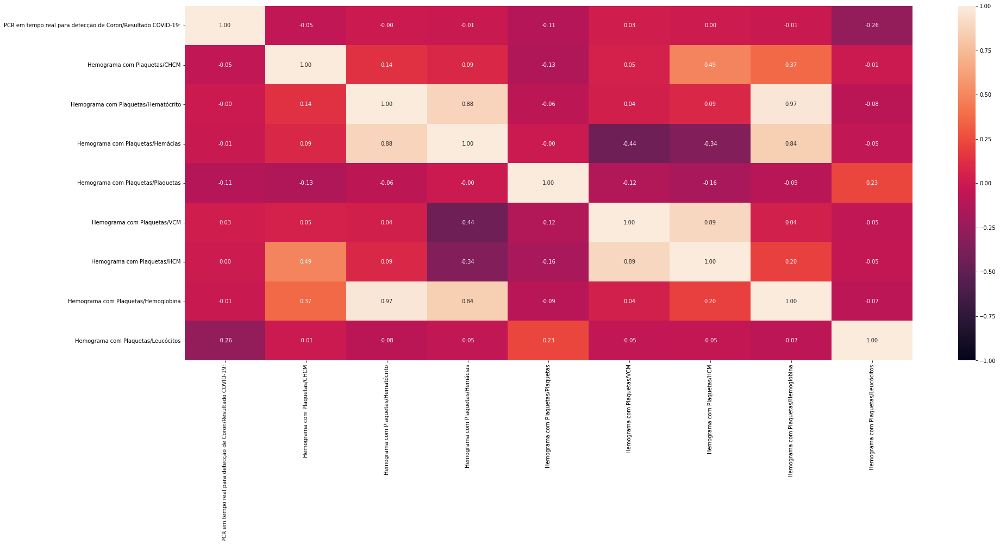

In [ ]:
import seaborn as ssns
import matplotlib.pyplot as plt

#correlacao
corr = dfFinal.corr()

plt.rcParams['figure.figsize'] = (30, 12)
ssns.heatmap(corr, vmin=-1, fmt = '.2f', annot= True)

### 17.2 Verificando quais colunas possuem mais dados faltantes no Dataset1

In [ ]:
dicionario = {}
for i in dfFinal.columns:
  dicionario[i] = dfFinal[i].isna().sum() / dfFinal.shape[0]
sorted(dicionario.items(), reverse= False, key= lambda x: x[1])  

[('ID_PACIENTE', 0.0),
 ('DT_COLETA', 0.0),
 ('PCR em tempo real para detecção de Coron/Resultado COVID-19:',
  0.319969665468055),
 ('Hemograma com Plaquetas/Hematócrito', 0.811994069428586),
 ('Hemograma com Plaquetas/Hemoglobina', 0.8120025903645256),
 ('Hemograma com Plaquetas/Leucócitos', 0.8120025903645256),
 ('Hemograma com Plaquetas/VCM', 0.8120111113004652),
 ('Hemograma com Plaquetas/CHCM', 0.8120281531723444),
 ('Hemograma com Plaquetas/Hemácias', 0.8120281531723444),
 ('Hemograma com Plaquetas/HCM', 0.8120366741082841),
 ('Hemograma com Plaquetas/Plaquetas', 0.8120963206598613)]

In [ ]:
dfFinal2 = dfFinal.copy()
dfFinal2 = dfFinal2[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
#'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
#'Hemograma com Plaquetas/HCM',
#'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos']]
dfFinal = dfFinal2.copy()

### 17.3 Removendo valores Ausentes Dataset1


In [ ]:
dfFinal.set_index(['ID_PACIENTE', 'DT_COLETA'], inplace= True)
dfFinal.dropna(inplace= True)
dfFinal.shape

(5507, 17)

## 17.2 Trabalhando com Dataset2


In [3]:
data2 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/DataSet2/UnificadoDataSet2.csv", sep=',')
data2 = data2[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]
dfFinal = data2.copy()

### 17.2.1 CORRELAÇÃO DATASET 2

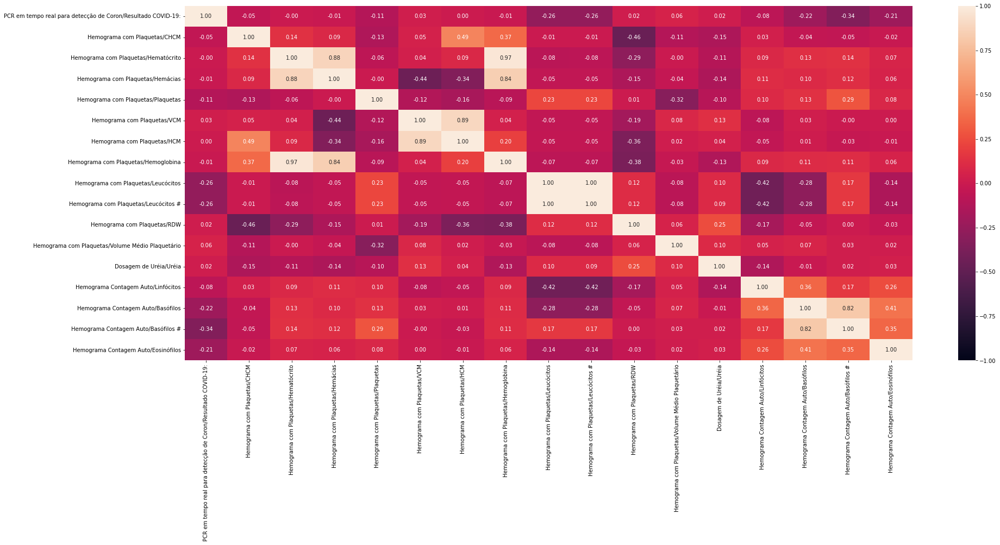

In [ ]:
import seaborn as ssns
import matplotlib.pyplot as plt

#correlacao
corr = dfFinal.corr()

plt.rcParams['figure.figsize'] = (30, 12)
ssns.heatmap(corr, vmin=-1, fmt = '.2f', annot= True)

### 17.2.2 Verificando quais colunas possuem mais dados faltantes no Dataset1

In [ ]:
dicionario = {}
for i in dfFinal.columns:
  dicionario[i] = dfFinal[i].isna().sum() / dfFinal.shape[0]
sorted(dicionario.items(), reverse= False, key= lambda x: x[1])  

[('ID_PACIENTE', 0.0),
 ('DT_COLETA', 0.0),
 ('PCR em tempo real para detecção de Coron/Resultado COVID-19:',
  0.31975520154107107),
 ('Hemograma com Plaquetas/Hematócrito', 0.8119347772351071),
 ('Hemograma com Plaquetas/Hemoglobina', 0.8119433008583289),
 ('Hemograma com Plaquetas/Leucócitos', 0.8119433008583289),
 ('Hemograma com Plaquetas/Leucócitos #', 0.8119433008583289),
 ('Hemograma com Plaquetas/VCM', 0.8119518244815506),
 ('Hemograma com Plaquetas/CHCM', 0.8119688717279941),
 ('Hemograma com Plaquetas/Hemácias', 0.8119688717279941),
 ('Hemograma com Plaquetas/HCM', 0.8119773953512159),
 ('Hemograma com Plaquetas/Plaquetas', 0.8120370607137682),
 ('Hemograma com Plaquetas/RDW', 0.8120626315834335),
 ('Hemograma com Plaquetas/Volume Médio Plaquetário', 0.8129746592681617),
 ('Hemograma Contagem Auto/Basófilos', 0.8209357233572847),
 ('Hemograma Contagem Auto/Eosinófilos', 0.82096129422695),
 ('Hemograma Contagem Auto/Basófilos #', 0.8209783414733935),
 ('Hemograma Contagem Aut

In [ ]:
dfFinal2 = dfFinal.copy()
dfFinal2 = dfFinal2[[
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
#'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
#'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
#'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
#'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
#'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]
dfFinal = dfFinal2.copy()

### 17.2.3 Removendo valores Ausentes Dataset2


In [4]:
dfFinal.set_index(['ID_PACIENTE', 'DT_COLETA'], inplace= True)
dfFinal.dropna(inplace= True)
dfFinal.shape

(5507, 17)

In [ ]:
dfFinal2 = dfFinal.copy()
dfFinal2 = dfFinal2[[
#'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]
dfFinal = dfFinal2.copy()

In [ ]:
dfFinal.columns

Index(['Hemograma com Plaquetas/CHCM', 'Hemograma com Plaquetas/Hematócrito',
       'Hemograma com Plaquetas/Hemácias', 'Hemograma com Plaquetas/Plaquetas',
       'Hemograma com Plaquetas/VCM', 'Hemograma com Plaquetas/HCM',
       'Hemograma com Plaquetas/Hemoglobina',
       'Hemograma com Plaquetas/Leucócitos',
       'Hemograma com Plaquetas/Leucócitos #', 'Hemograma com Plaquetas/RDW',
       'Hemograma com Plaquetas/Volume Médio Plaquetário',
       'Dosagem de Uréia/Uréia', 'Hemograma Contagem Auto/Linfócitos',
       'Hemograma Contagem Auto/Basófilos',
       'Hemograma Contagem Auto/Basófilos #',
       'Hemograma Contagem Auto/Eosinófilos'],
      dtype='object')

## 17.3 Trabalhando com Dataset3

In [ ]:
data3 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/Dataset3/UnificadoDataSet3.csv", sep=',')
data3 = data3[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total']]
dfFinal = data3.copy()

### 17.3.1 CORRELAÇÃO DATASET 3

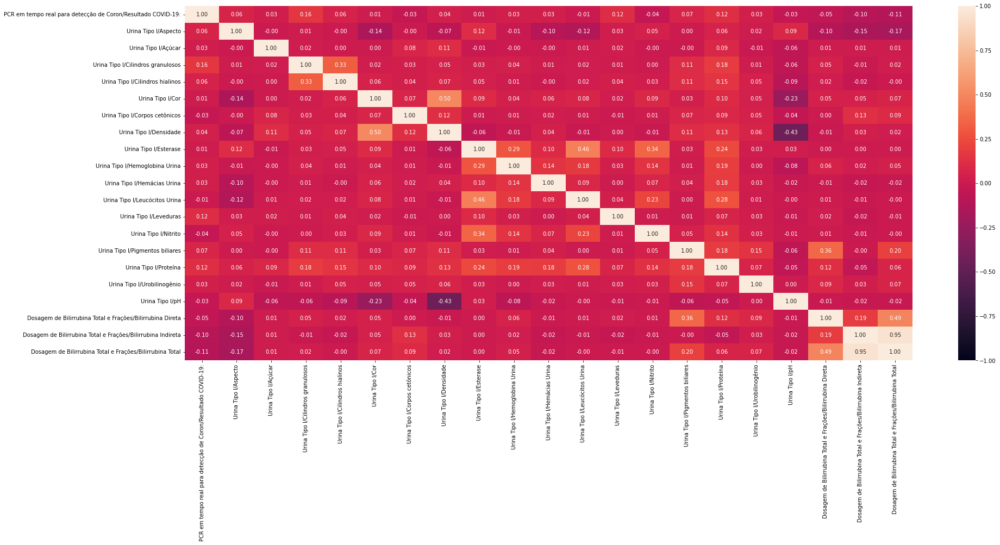

In [ ]:
import seaborn as ssns
import matplotlib.pyplot as plt

#correlacao
corr = dfFinal.corr()

plt.rcParams['figure.figsize'] = (30, 12)
ssns.heatmap(corr, vmin=-1, fmt = '.2f', annot= True)

In [ ]:
data3 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/Dataset3/UnificadoDataSet3.csv", sep=',')
data3 = data3[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
#'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total'
]]
dfFinal = data3.copy()

### 17.3.2 Removendo valores Ausentes Dataset3


In [ ]:
dfFinal.set_index(['ID_PACIENTE', 'DT_COLETA'], inplace= True)
dfFinal.dropna(inplace= True)
dfFinal.shape

(916, 20)

## 17.4 Trabalhando com Dataset4

In [ ]:
data4 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/UnificadoDataSet4CORRETO.csv", sep=',')
data4 = data4[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos', 'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total']]
dfFinal = data4.copy()

### 17.4.1 CORRELAÇÃO DATASET 4

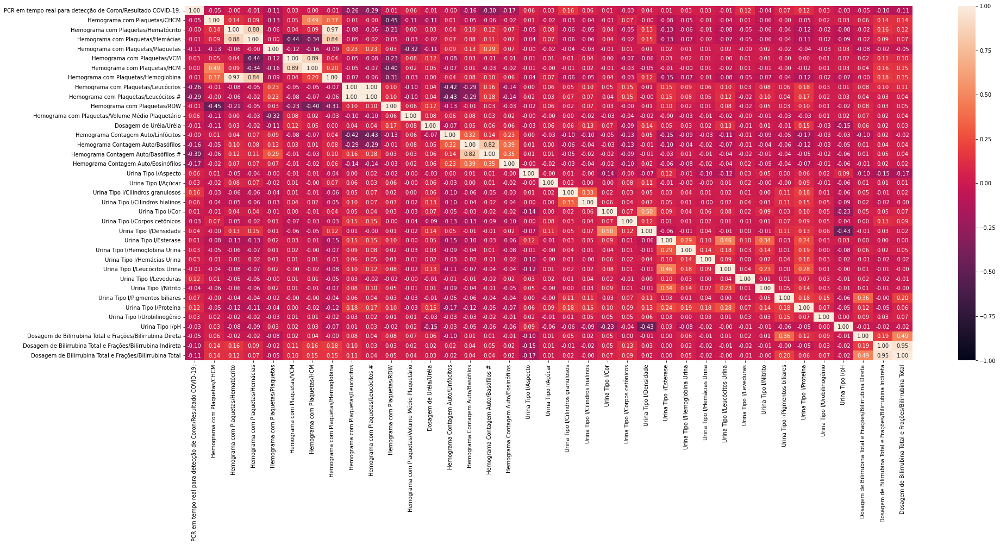

In [ ]:
import seaborn as ssns
import matplotlib.pyplot as plt

#correlacao
corr = dfFinal.corr()

plt.rcParams['figure.figsize'] = (30, 12)
ssns.heatmap(corr, vmin=-1, fmt = '.2f', annot= True)

In [ ]:
data4 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/UnificadoDataSet4CORRETO.csv", sep=',')
data4 = data4[[#'ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
#'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
#'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
#'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
#'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos', 'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
#'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total'
]]
dfFinal = data4.copy()

In [ ]:
dicionario = {}
for i in dfFinal.columns:
  dicionario[i] = dfFinal[i].isna().sum() / dfFinal.shape[0]
sorted(dicionario.items(), reverse= False, key= lambda x: x[1])  

[('PCR em tempo real para detecção de Coron/Resultado COVID-19:',
  0.3194651704172387),
 ('Hemograma com Plaquetas/Hematócrito', 0.8118545932071868),
 ('Hemograma com Plaquetas/Leucócitos', 0.811863120464565),
 ('Hemograma com Plaquetas/VCM', 0.8118716477219432),
 ('Hemograma com Plaquetas/CHCM', 0.8118887022366996),
 ('Hemograma com Plaquetas/HCM', 0.8118972294940778),
 ('Hemograma com Plaquetas/Plaquetas', 0.8119569202957253),
 ('Hemograma com Plaquetas/RDW', 0.8394743798552071),
 ('Hemograma com Plaquetas/Volume Médio Plaquetário', 0.8402588875340025),
 ('Hemograma Contagem Auto/Basófilos #', 0.8448124429739663),
 ('Hemograma Contagem Auto/Eosinófilos', 0.8448124429739663),
 ('Hemograma Contagem Auto/Linfócitos', 0.8448380247461009),
 ('Dosagem de Uréia/Uréia', 0.8751524247256355),
 ('Urina Tipo I/Hemácias Urina', 0.9096451808204927),
 ('Urina Tipo I/Leucócitos Urina', 0.9096451808204927),
 ('Urina Tipo I/Leveduras', 0.9096537080778709),
 ('Urina Tipo I/Aspecto', 0.9096622353352491

In [ ]:
dfFinal2 = dfFinal.copy()
dfFinal2 = dfFinal2[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
#'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
#'Hemograma com Plaquetas/HCM',
#'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
#'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos', 'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta'
#'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total'
]]
dfFinal = dfFinal2.copy()

KeyError: ignored

### 17.4.2 Removendo valores Ausentes Dataset4



In [ ]:
#dfFinal.set_index(['ID_PACIENTE', 'DT_COLETA'], inplace= True)
dfFinal.dropna(inplace= True)
dfFinal.shape

(282, 39)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  self._figure.tight_layout(*args, **kwargs)


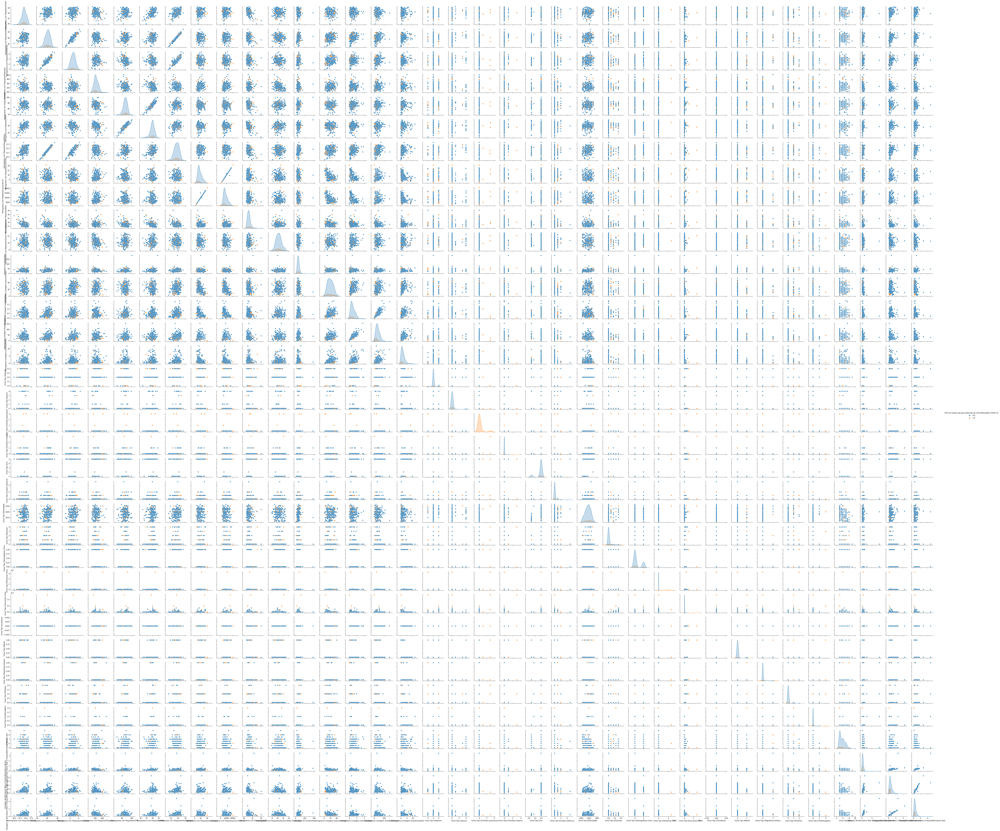

In [ ]:
import seaborn as sns

sns.pairplot(data=dfFinal, hue="PCR em tempo real para detecção de Coron/Resultado COVID-19:")

## 17.5 Trabalhando com Dataset5


In [ ]:
import pandas as pd
data5 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/Dataset3/UnificadoDataSet3.csv", sep=',')
data5 = data5[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Urina Tipo I/Aspecto',
 'Urina Tipo I/Açúcar',
 'Urina Tipo I/Cilindros granulosos',
 'Urina Tipo I/Cilindros hialinos',
 'Urina Tipo I/Cor',
 'Urina Tipo I/Corpos cetônicos',
 #'Urina Tipo I/Cristais',
 'Urina Tipo I/Densidade',
 'Urina Tipo I/Esterase',
 'Urina Tipo I/Hemoglobina Urina',
 'Urina Tipo I/Hemácias Urina',
 'Urina Tipo I/Leucócitos Urina',
 'Urina Tipo I/Leveduras',
 'Urina Tipo I/Nitrito',
 'Urina Tipo I/Pigmentos biliares',
 'Urina Tipo I/Proteína',
 'Urina Tipo I/Urobilinogênio',
 'Urina Tipo I/pH']]
dfFinal = data5.copy()

## 17.5.1 CORRELAÇÃO DATASET 5

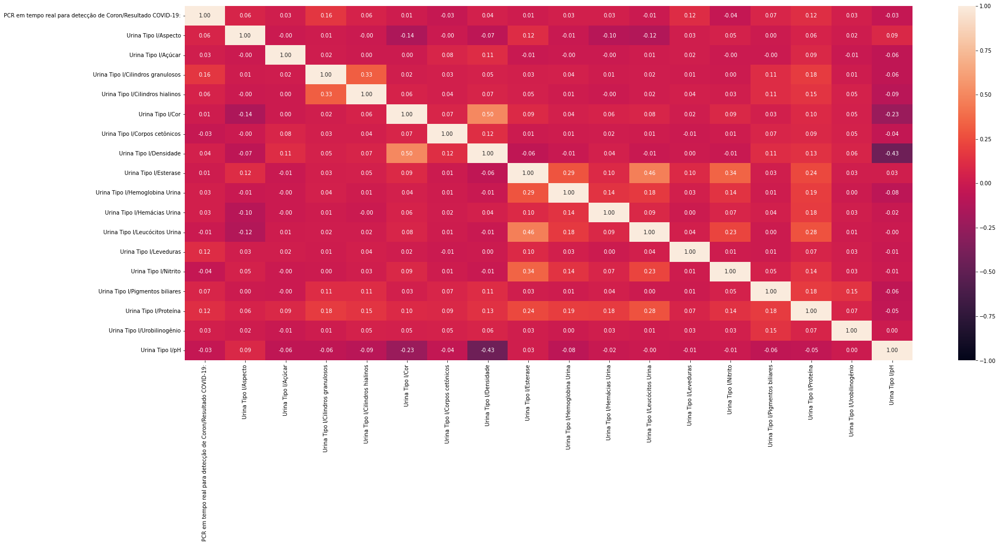

In [ ]:
import seaborn as ssns
import matplotlib.pyplot as plt

#correlacao
corr = dfFinal.corr()

plt.rcParams['figure.figsize'] = (30, 12)
ssns.heatmap(corr, vmin=-1, fmt = '.2f', annot= True)

### 17.5.2 Removendo valores Ausentes

In [ ]:
#dfFinal.set_index(['ID_PACIENTE', 'DT_COLETA'], inplace= True)
dfFinal.dropna(inplace= True)
dfFinal.shape


(5507, 19)

#18 Verificando quantidade de valores em cada classe

Dataset1 5934 de 0 e 1941 de 1 ou seja, 32,71%

Dataset2 3949 de 0 e 1558 de 1 ou seja 39,45

Dataset3 706 de 0 e 210 de 1 ou seja, 29,75

Dataset4 250 de 0 e 32 de 1 ou seja 12,8

Dataset5 1788 de 0 e 325 de 1 ou seja, 18,18



In [ ]:
dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].value_counts()

0.0    3949
1.0    1558
Name: PCR em tempo real para detecção de Coron/Resultado COVID-19:, dtype: int64

In [ ]:
dfFinal.head()

,ID_PACIENTE,DT_COLETA,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos
0,00006490d57666d73747c29c01079b60b1353002,2020-05-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00006490d57666d73747c29c01079b60b1353002,2020-06-05,1.0,34.200001,40.900002,4.91,626.0,83.300003,28.5,14.0,12.04
2,00011583dd847df7a6d6a98e2110f9a69396f2ad,2020-07-27,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,00012e05d80f5884023c3b6eaa3294e41d7c58bc,2020-03-25,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00012e05d80f5884023c3b6eaa3294e41d7c58bc,2020-07-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#19 Usando pycaret para comparar modelos
VER O PARAMETRO fix_imbalance


In [ ]:
!pip install pycaret[full]

In [ ]:
# Carregar bibliotecas
import numpy as np                                    # Numpy
import pandas as pd                                   # Pandas
from sklearn.model_selection import train_test_split  # Scikit separar treino/teste
import pycaret                                        # Pycaret
from pycaret.classification import *                      # Pycaret para Regressão
from pycaret.utils import enable_colab                # Para executar gráficos no Colab


TypeError: ignored

In [ ]:
new_dfFinal = dfFinal.assign(Resultado=dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'])
new_dfFinal.drop(inplace = True, columns=['PCR em tempo real para detecção de Coron/Resultado COVID-19:'])

In [ ]:
new_dfFinal.columns

Index(['Hemograma com Plaquetas/CHCM', 'Hemograma com Plaquetas/Hematócrito',
       'Hemograma com Plaquetas/Hemácias', 'Hemograma com Plaquetas/Plaquetas',
       'Hemograma com Plaquetas/VCM', 'Hemograma com Plaquetas/HCM',
       'Hemograma com Plaquetas/Hemoglobina',
       'Hemograma com Plaquetas/Leucócitos', 'Resultado'],
      dtype='object')

In [ ]:
new_dfFinal = new_dfFinal.head(10000)

In [ ]:
new_dfFinal.shape
new_dfFinal.head()

,,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Resultado
ID_PACIENTE,DT_COLETA,,,,,,,,,
00006490d57666d73747c29c01079b60b1353002,2020-06-05,34.200001,40.900002,4.91,626.0,83.300003,28.500000,14.0,12.04,1.0
00047db92967b41241b483201a42a8a400f0bd07,2020-04-20,35.000000,45.400002,4.86,182.0,93.400002,32.700001,15.9,16.07,1.0
000bb5ffdfd9bfd09e40294697e95a196f299307,2020-06-04,33.599998,27.400000,2.98,132.0,91.900002,30.900000,9.2,8.11,0.0
00162378dc4d5be677f1ba3b7ea81d693f55bcef,2020-07-31,34.700001,40.599998,4.46,222.0,91.000000,31.600000,14.1,4.85,0.0
001b35522f58c7dd29b6e04b9e6f5ae0ba5af278,2020-07-24,33.900002,40.400002,4.44,278.0,91.000000,30.900000,13.7,5.28,0.0


In [ ]:
test.drop(inplace = True, columns=['Resultado'])


In [ ]:
test.head()

,,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos
ID_PACIENTE,DT_COLETA,,,,,,,,,,,,,,,,,
41ae449c6095fc2c84cd948d9f5cf96838c445b2,2020-05-16,1.0,35.299999,33.099998,4.20,221.0,78.800003,27.900000,11.7,13.11,13110.0,14.1,9.5,78.0,3.100000,0.0,0.0,0.0
36b6a0e779f57dddb2fa14ef7673b78272258182,2020-03-15,0.0,33.599998,39.000000,4.53,294.0,86.099998,28.900000,13.1,5.12,5120.0,12.1,9.9,14.0,22.700001,0.2,10.0,0.4
d2e136825e91e36457f2a08afdce15e53640e302,2020-04-06,0.0,35.599998,39.599998,4.70,203.0,84.300003,30.000000,14.1,7.66,7660.0,11.2,10.0,28.0,16.299999,0.0,0.0,0.1
d4d280bcb496e6f4e23fa17c0fd71d0af1489688,2020-07-10,1.0,31.600000,35.099998,3.90,180.0,90.000000,28.500000,11.1,7.17,7170.0,15.7,9.9,53.0,6.000000,0.3,22.0,0.6
569c298a557056bb88968f1f8f8fed0fae568436,2020-07-09,0.0,34.400002,39.500000,4.51,213.0,87.599998,30.200001,13.6,5.70,5700.0,12.0,10.6,30.0,17.200001,0.4,23.0,11.8


In [ ]:
train, test = train_test_split(new_dfFinal, test_size=0.3,
                                     random_state=42)

In [ ]:
new_dfFinal["ID_PACIENTE"] = pd.to_numeric(new_dfFinal["ID_PACIENTE"], downcast="float")

KeyError: ignored

In [ ]:
clas = setup(preprocess=False,
              data = train,           # Banco de dados
              target = 'Resultado',   # Desfecho que estamos tentando prever
              train_size = 0.7,
              fix_imbalance =  True
             )  

,Description,Value
0,session_id,8073
1,Target,Resultado
2,Target Type,Binary
3,Label Encoded,"0.0: 0, 1.0: 1"
4,Original Data,"(5511, 9)"
5,Missing Values,False
6,Numeric Features,8
7,Categorical Features,0
8,Transformed Train Set,"(3857, 8)"
9,Transformed Test Set,"(1654, 8)"


In [ ]:
compare_models( round = 4,  sort = 'Accuracy', turbo = True, fold = 10)
# 5 corresponde a 100%
# 4 irá pegar para treino, ou seja 80% e outros 20 para teste

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.7781,0.7371,0.3202,0.6337,0.4241,0.3047,0.3326,0.510
catboost,CatBoost Classifier,0.7765,0.7328,0.3252,0.6233,0.4262,0.3043,0.3297,4.314
ada,Ada Boost Classifier,0.7737,0.7304,0.3151,0.6126,0.4147,0.2925,0.3178,0.218
et,Extra Trees Classifier,0.7690,0.7161,0.2715,0.6111,0.3747,0.2583,0.2908,0.670
rf,Random Forest Classifier,0.7643,0.7135,0.3039,0.5758,0.3971,0.2678,0.2893,0.888
lightgbm,Light Gradient Boosting Machine,0.7633,0.7092,0.3213,0.5688,0.4094,0.2756,0.2938,0.146
lr,Logistic Regression,0.7568,0.7213,0.0963,0.6601,0.1671,0.1110,0.1826,0.414
nb,Naive Bayes,0.7542,0.7109,0.1450,0.5840,0.2314,0.1442,0.1947,0.019
xgboost,Extreme Gradient Boosting,0.7477,0.6888,0.3272,0.5115,0.3987,0.2489,0.2590,2.387
lda,Linear Discriminant Analysis,0.7459,0.7155,0.0264,0.5964,0.0502,0.0287,0.0808,0.022


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=8073, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
#gbr.get_params()
type(gbr)
predict_model(gbr, data= test)

,,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos,Resultado,Label,Score
ID_PACIENTE,DT_COLETA,,,,,,,,,,,,,,,,,,,,
41ae449c6095fc2c84cd948d9f5cf96838c445b2,2020-05-16,1.0,35.299999,33.099998,4.20,221.0,78.800003,27.900000,11.7,13.11,13110.0,14.1,9.5,78.0,3.100000,0.0,0.0,0.0,1.0,1.0,1.0
36b6a0e779f57dddb2fa14ef7673b78272258182,2020-03-15,0.0,33.599998,39.000000,4.53,294.0,86.099998,28.900000,13.1,5.12,5120.0,12.1,9.9,14.0,22.700001,0.2,10.0,0.4,0.0,0.0,1.0
d2e136825e91e36457f2a08afdce15e53640e302,2020-04-06,0.0,35.599998,39.599998,4.70,203.0,84.300003,30.000000,14.1,7.66,7660.0,11.2,10.0,28.0,16.299999,0.0,0.0,0.1,0.0,0.0,1.0
d4d280bcb496e6f4e23fa17c0fd71d0af1489688,2020-07-10,1.0,31.600000,35.099998,3.90,180.0,90.000000,28.500000,11.1,7.17,7170.0,15.7,9.9,53.0,6.000000,0.3,22.0,0.6,1.0,1.0,1.0
569c298a557056bb88968f1f8f8fed0fae568436,2020-07-09,0.0,34.400002,39.500000,4.51,213.0,87.599998,30.200001,13.6,5.70,5700.0,12.0,10.6,30.0,17.200001,0.4,23.0,11.8,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
def31978fb0e9c98a5e53c3c906e1e8cfd9d2069,2020-06-02,1.0,33.700001,37.700001,4.29,188.0,87.900002,29.600000,12.7,4.43,4430.0,12.1,10.6,24.0,42.700001,0.5,22.0,1.1,1.0,1.0,1.0
5228ae383c3b324eb4815fe7a06c5a4b4e4896a6,2020-06-02,1.0,35.000000,40.299999,4.63,244.0,87.000000,30.500000,14.1,4.42,4420.0,12.1,11.0,23.0,49.099998,0.2,9.0,0.7,1.0,1.0,1.0
673dc109f5ffae10d37224d7160a65b5d2ffe2fc,2020-07-12,1.0,33.200001,36.500000,4.16,135.0,87.699997,29.100000,12.1,7.99,7990.0,12.5,11.4,49.0,9.000000,0.3,24.0,0.3,1.0,1.0,1.0


In [ ]:
gbr = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0,1.0,1.0


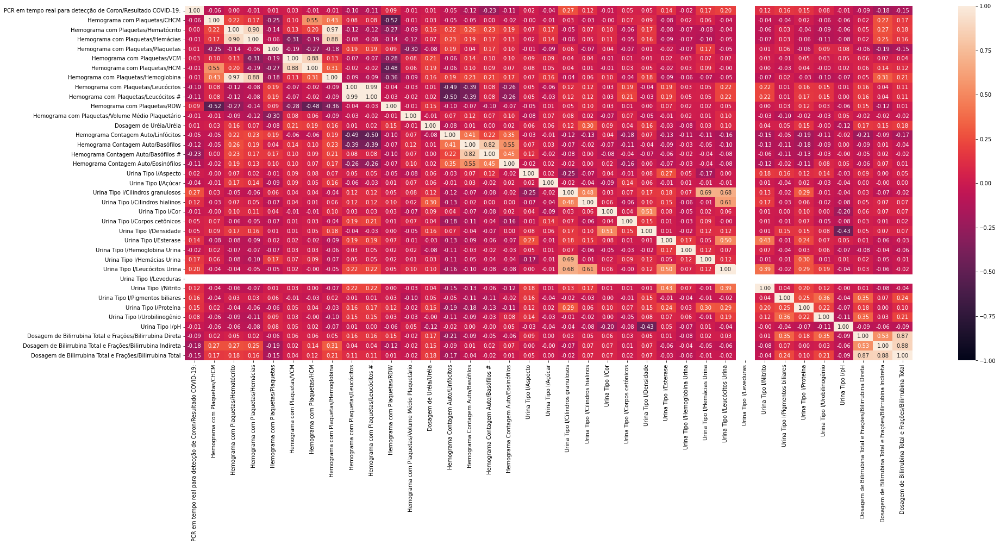

In [ ]:
import seaborn as ssns
import matplotlib.pyplot as plt

#correlacao
corr = dfFinal.corr()

plt.rcParams['figure.figsize'] = (30, 12)
ssns.heatmap(corr, vmin=-1, fmt = '.2f', annot= True)

In [ ]:
dfFinal.head()

,,PCR em tempo real para detecção de Coron/Resultado COVID-19:,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta,Dosagem de Bilirrubina Total e Frações/Bilirrubina Total
ID_PACIENTE,DT_COLETA,,,,,,,,,,,,,,,,,,,,,
00047db92967b41241b483201a42a8a400f0bd07,2020-04-20,1.0,5.0,0.0,0.0,0.0,6.0,0.0,1020.0,0.0,0.0,6000.0,8000.0,0.0,0.0,0.0,1.0,0.0,6.0,0.2,0.2,0.4
0038fa1282332f290716cf10f631aad9bd594c74,2020-07-18,0.0,4.0,0.0,0.0,0.0,5.0,0.0,1026.0,0.0,0.0,4000.0,8000.0,0.0,0.0,0.0,0.0,0.0,5.0,0.1,0.2,0.3
005844cefaea9a1fde8a9816b37b53920ed6fd00,2020-06-28,0.0,4.0,0.0,0.0,0.0,5.0,0.0,1010.0,0.0,0.0,2000.0,1000.0,0.0,0.0,0.0,0.0,0.0,7.0,0.1,0.2,0.3
005bf706090ef516b2f477199d2940b3ace437f6,2020-06-16,0.0,4.0,0.0,0.0,0.0,5.0,0.0,1013.0,0.0,0.0,1000.0,4000.0,0.0,0.0,0.0,0.0,0.0,6.0,0.2,0.1,0.3
005e37ee20c6d09138910aa1d980ff4644daa02c,2020-05-26,0.0,4.0,0.0,0.0,0.0,1.0,0.0,1009.0,0.0,0.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,5.0,0.1,0.2,0.3


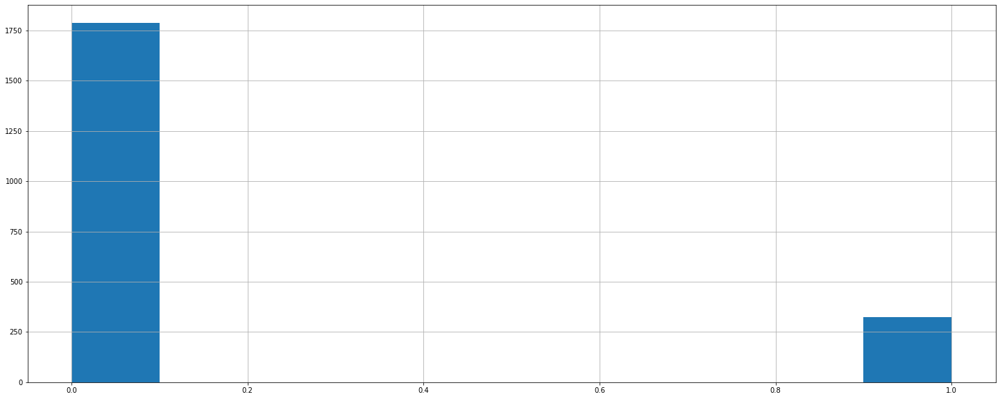

In [ ]:
dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].hist()

# 20 Treino e teste  30% para teste e 70% para treinamento

In [ ]:
from sklearn.model_selection import train_test_split

Xtreino, Xteste, ytreino, yteste = train_test_split(
                dfFinal[['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos'
]],
                dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], test_size=.30, 
                stratify=dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], random_state=0)

In [ ]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

Xtreino = ss.fit_transform(Xtreino)
Xteste = ss.transform(Xteste)

# 21 Aplicando KNN

Para esse modelo foi aplicado o dataset2

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# K = numero de linhas ^ (1/2)
k = 73
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(Xtreino, ytreino)


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=73, p=2,
                     weights='uniform')

In [ ]:
from sklearn.metrics import accuracy_score

yestimativa = knn.predict(Xteste)
print(accuracy_score(yteste, yestimativa))

0.7876588021778584


# 21 KNN com outra config.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score # curva de probabilidade que traça o verdadeiro positivo contra o FPR
from sklearn.model_selection import train_test_split
#quanto mais alto o roc melhor é
from scipy.stats import ks_2samp

def treino_resultado(model):
    model.fit(Xtreino, ytreino)  
    y_pred = model.predict(Xteste)
    #CM and Acc
    print("Matriz Confusão: \n", confusion_matrix(yteste, y_pred))  
    print("Métricas de Classficação: \n", classification_report(yteste, y_pred))  
    print("Acurácia: ", accuracy_score(yteste, y_pred))   
    print("Revocação:", recall_score(yteste, y_pred))
    #AUC and KS
    print("AUC: ", roc_auc_score(yteste, y_pred))
    print("KS: ", ks_2samp(y_pred[yteste == 0], y_pred[yteste == 1]).statistic)
    
X = dfFinal[['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos'
]].values 
y = dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].values
Xtreino, Xteste, ytreino, yteste = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)
print("Split between test and train!")

#Aplicando KNN
k = 73
knn = KNeighborsClassifier(n_neighbors=k)
treino_resultado(knn)

#rf = RandomForestClassifier(n_estimators=100, max_features='auto', random_state=42)  
#treino_resultado(rf)

Split between test and train!
Matriz Confusão: 
 [[1089   96]
 [ 228  240]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.83      0.92      0.87      1185
         1.0       0.71      0.51      0.60       468

    accuracy                           0.80      1653
   macro avg       0.77      0.72      0.73      1653
weighted avg       0.80      0.80      0.79      1653

Acurácia:  0.8039927404718693
Revocação: 0.5128205128205128
AUC:  0.7159039272963323
KS:  0.43180785459266474


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
random_grid = {
    'n_neighbors': [74],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
    }
knn = KNeighborsClassifier()

knn_random = RandomizedSearchCV(estimator = knn, param_distributions = random_grid, 
                            n_iter = 100, cv = 5, scoring = 'recall', 
                            verbose=0, random_state=42, n_jobs = -1)

treino_resultado(knn_random)
print(knn_random.best_params_)



/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=100. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


Matriz Confusão: 
 [[1096   89]
 [ 303  165]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.78      0.92      0.85      1185
         1.0       0.65      0.35      0.46       468

    accuracy                           0.76      1653
   macro avg       0.72      0.64      0.65      1653
weighted avg       0.75      0.76      0.74      1653

Acurácia:  0.7628554143980641
Revocação: 0.3525641025641026
AUC:  0.6387293086660175
KS:  0.27745861733203503
{'weights': 'distance', 'p': 1, 'n_neighbors': 74}


In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import AllKNN
from collections import Counter
import numpy as np


#smt = SMOTE(k_neighbors=5, random_state=42)
smt = AllKNN()
Xtreino, ytreino = smt.fit_sample(Xtreino, ytreino)

Counter(ytreino)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Counter({0.0: 2158, 1.0: 2158})

In [ ]:
dfPy = Xtreino.assign(Resultado = ytreino)


In [ ]:
dfPy

,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos,Resultado
0,34.099998,43.099998,5.24,225.0,82.300003,28.100000,14.7,7.41,7410.0,12.1,9.9,22.0,21.600000,0.7,52.0,10.3,0.0
1,33.799999,48.799999,5.59,233.0,87.300003,29.500000,16.5,12.37,12370.0,12.3,10.4,25.0,33.099998,0.6,74.0,1.6,0.0
2,33.500000,37.599998,4.36,272.0,86.199997,28.900000,12.6,12.04,12040.0,12.8,9.2,26.0,8.300000,0.2,24.0,0.5,0.0
3,33.400002,38.599998,3.98,306.0,97.000000,32.400002,12.9,12.37,12370.0,12.9,9.3,24.0,28.400000,0.2,25.0,1.6,0.0
4,34.500000,36.500000,4.35,136.0,83.900002,29.000000,12.6,9.27,9270.0,12.2,10.0,24.0,11.000000,0.2,19.0,0.8,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2356,34.000000,41.799999,4.60,130.0,90.900002,30.900000,14.2,6.21,6210.0,12.3,11.2,32.0,22.100000,0.2,12.0,0.2,1.0
2357,33.400002,38.599998,4.37,248.0,88.300003,29.500000,12.9,5.81,5810.0,13.0,10.1,39.0,42.000000,0.3,17.0,2.6,1.0
2358,34.099998,38.400002,4.33,224.0,88.699997,30.299999,13.1,7.77,7770.0,12.3,10.1,47.0,26.299999,0.4,31.0,3.1,1.0
2359,32.900002,39.200001,5.11,247.0,76.699997,25.200001,12.9,6.25,6250.0,15.0,9.9,39.0,11.700000,0.2,12.0,1.6,1.0


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
random_grid = {
    'n_neighbors': [74],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
    }
knn = KNeighborsClassifier()

knn_random = RandomizedSearchCV(estimator = knn, param_distributions = random_grid, 
                            n_iter = 100, cv = 5, scoring = 'recall', 
                            verbose=0, random_state=42, n_jobs = -1)

treino_resultado(knn_random)
print(knn_random.best_params_)


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=100. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


Matriz Confusão: 
 [[856 329]
 [169 299]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.84      0.72      0.77      1185
         1.0       0.48      0.64      0.55       468

    accuracy                           0.70      1653
   macro avg       0.66      0.68      0.66      1653
weighted avg       0.73      0.70      0.71      1653

Acurácia:  0.6987295825771325
Revocação: 0.6388888888888888
AUC:  0.6806258790436005
KS:  0.3612517580872011
{'weights': 'distance', 'p': 1, 'n_neighbors': 74}


#22 RANDOM FOREST


In [ ]:
Para esse modelo foi utilizado o dataset2

In [5]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score # curva de probabilidade que traça o verdadeiro positivo contra o FPR
from sklearn.model_selection import train_test_split
#quanto mais alto o roc melhor é
from scipy.stats import ks_2samp

def treino_resultado(model):
    model.fit(Xtreino, ytreino)  
    y_pred = model.predict(Xteste)
    #Matriz Confusão e Métricas de Classificacao
    print("Matriz Confusão: \n", confusion_matrix(yteste, y_pred))  
    print("Métricas de Classficação: \n", classification_report(yteste, y_pred))  
    print("Acurácia: ", accuracy_score(yteste, y_pred))   
    print("Revocação:", recall_score(yteste, y_pred))
    #AUC e KS
    print("AUC: ", roc_auc_score(yteste, y_pred))
    print("KS: ", ks_2samp(y_pred[yteste == 0], y_pred[yteste == 1]).statistic)
    
X = dfFinal[['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos'
]].values 
y = dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].values
Xtreino, Xteste, ytreino, yteste = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)
print("Split between test and train!")

#Aplicando KNN
#k = 73
#knn = KNeighborsClassifier(n_neighbors=k)
#treino_resultado(knn)

rf = RandomForestClassifier(n_estimators=100, max_features='auto', random_state=42)  


treino_resultado(rf)

Split between test and train!
Matriz Confusão: 
 [[1089   96]
 [ 228  240]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.83      0.92      0.87      1185
         1.0       0.71      0.51      0.60       468

    accuracy                           0.80      1653
   macro avg       0.77      0.72      0.73      1653
weighted avg       0.80      0.80      0.79      1653

Acurácia:  0.8039927404718693
Revocação: 0.5128205128205128
AUC:  0.7159039272963323
KS:  0.43180785459266474


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
random_grid = {'n_estimators': [10, 50, 100, 200, 400],
            'max_features': ['auto', 'sqrt', 'log2', 5, 10, 30],
            'max_depth': [2, 8, 16, 32, 64, 128],
            'min_samples_split': [1,2,4,8,16,24],
            'min_samples_leaf': [1,2,5,10,15,30]}

rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, 
                            n_iter = 200, cv = 5, scoring = 'recall', 
                            verbose=0, random_state=42, n_jobs = -1)

# Fit the random search model
treino_resultado(rf_random)
print(rf_random.best_params_)

In [6]:
TotalX = dfFinal[['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos'
]].values 
TotalY = dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].values



## 22.1 Undersampler

In [7]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler 
from collections import Counter
import numpy as np


#smt = SMOTE(k_neighbors=5, random_state=42)
smt = RandomUnderSampler(sampling_strategy='auto')
Xtreino, ytreino = smt.fit_sample(TotalX, TotalY)

Counter(ytreino)


/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Counter({0.0: 1558, 1.0: 1558})

In [8]:
df_smote = pd.DataFrame(Xtreino)
df_smote.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,35.500000,38.599998,4.44,210.0,86.900002,30.900000,13.7,8.37,8370.0,11.9,9.2,45.0,28.100000,0.1,8.0,2.4
1,34.099998,38.099998,4.25,217.0,89.599998,30.600000,13.0,11.31,11310.0,11.8,9.3,19.0,12.100000,0.4,45.0,1.6
2,33.900002,37.799999,4.13,192.0,91.500000,31.000000,12.8,3.98,3980.0,13.4,11.0,28.0,46.200001,1.0,40.0,5.9
3,33.299999,31.799999,3.46,220.0,91.900002,30.600000,10.6,6.11,6110.0,15.2,10.3,38.0,18.500000,0.3,18.0,0.3
4,36.099998,35.700001,4.58,340.0,77.900002,28.200001,12.9,9.58,9580.0,12.2,8.1,14.0,29.500000,0.5,48.0,2.6


In [9]:
df_smote = df_smote.rename(columns ={
0:'Hemograma com Plaquetas/CHCM',
1:'Hemograma com Plaquetas/Hematócrito',
2:'Hemograma com Plaquetas/Hemácias',
3:'Hemograma com Plaquetas/Plaquetas',
4:'Hemograma com Plaquetas/VCM',
5:'Hemograma com Plaquetas/HCM',
6:'Hemograma com Plaquetas/Hemoglobina',
7:'Hemograma com Plaquetas/Leucócitos',
8:'Hemograma com Plaquetas/Leucócitos #',
9:'Hemograma com Plaquetas/RDW',
10:'Hemograma com Plaquetas/Volume Médio Plaquetário',
11:'Dosagem de Uréia/Uréia',
12:'Hemograma Contagem Auto/Linfócitos',
13:'Hemograma Contagem Auto/Basófilos',
14:'Hemograma Contagem Auto/Basófilos #' ,
15:'Hemograma Contagem Auto/Eosinófilos'
})

In [10]:
df_smote = df_smote.assign(PCR =  pd.DataFrame(ytreino))
df_smote.head()

,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos,PCR
0,35.500000,38.599998,4.44,210.0,86.900002,30.900000,13.7,8.37,8370.0,11.9,9.2,45.0,28.100000,0.1,8.0,2.4,0.0
1,34.099998,38.099998,4.25,217.0,89.599998,30.600000,13.0,11.31,11310.0,11.8,9.3,19.0,12.100000,0.4,45.0,1.6,0.0
2,33.900002,37.799999,4.13,192.0,91.500000,31.000000,12.8,3.98,3980.0,13.4,11.0,28.0,46.200001,1.0,40.0,5.9,0.0
3,33.299999,31.799999,3.46,220.0,91.900002,30.600000,10.6,6.11,6110.0,15.2,10.3,38.0,18.500000,0.3,18.0,0.3,0.0
4,36.099998,35.700001,4.58,340.0,77.900002,28.200001,12.9,9.58,9580.0,12.2,8.1,14.0,29.500000,0.5,48.0,2.6,0.0


In [11]:
df_smote = df_smote.rename(columns ={
'PCR':'PCR em tempo real para detecção de Coron/Resultado COVID-19:'})

In [12]:
df_smote.shape


(3116, 17)

## 22.2 Montando dataset 2 e separando um novo dataset com apenas o valor de PCR para poder calcular as métricas

In [13]:
dfFinal2 = dfFinal.copy()
dfFinal2 = dfFinal2[[
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]
dfFinal = dfFinal2.copy()

dfFinal2 = dfFinal.copy()
dfFinal2 = dfFinal2[[
'PCR em tempo real para detecção de Coron/Resultado COVID-19:'
]]
yy = dfFinal2.copy()

dfFinal2 = dfFinal.copy()
dfFinal2 = dfFinal2[[
#'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]
dfFinal = dfFinal2.copy()

## 22.3 Aplicando treino e teste após o tratamento com Undersampling

In [14]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score # curva de probabilidade que traça o verdadeiro positivo contra o FPR
from sklearn.model_selection import train_test_split
#quanto mais alto o roc melhor é
from scipy.stats import ks_2samp

def treino_resultado(model):
    model.fit(Xtreino, ytreino)  
    y_pred = model.predict(dfFinal)
    #Matriz Confusão e Métricas de Classificacao
    print("Matriz Confusão: \n", confusion_matrix(yy, y_pred))  
    print("Métricas de Classficação: \n", classification_report(yy, y_pred))  
    print("Acurácia: ", accuracy_score(yy, y_pred))   
    print("Revocação:", recall_score(yy, y_pred))
    #AUC e KS
    print("AUC: ", roc_auc_score(yy, y_pred))
    #print("KS: ", ks_2samp(y_pred[yy == 0], y_pred[yy == 1]).statistic)
    
X = df_smote[['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos'
]].values 
y = df_smote['PCR em tempo real para detecção de Coron/Resultado COVID-19:'].values
Xtreino, Xteste, ytreino, yteste = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)
print("Split between test and train!")

#Aplicando KNN
#k = 73
#knn = KNeighborsClassifier(n_neighbors=k)
#treino_resultado(knn)

rf = RandomForestClassifier(n_estimators=100, max_features='auto', random_state=42)  


treino_resultado(rf)

Split between test and train!
Matriz Confusão: 
 [[3278  671]
 [ 130 1428]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.96      0.83      0.89      3949
         1.0       0.68      0.92      0.78      1558

    accuracy                           0.85      5507
   macro avg       0.82      0.87      0.84      5507
weighted avg       0.88      0.85      0.86      5507

Acurácia:  0.8545487561285636
Revocação: 0.9165596919127086
AUC:  0.8733216286861593


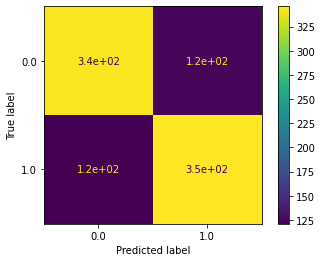

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(rf, X, Y, fmt = "d")

In [ ]:
rf = RandomForestClassifier(n_estimators=100, max_features='auto', random_state=42)  
treino_resultado(rf)

Matriz Confusão: 
 [[1005  180]
 [ 149  319]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.87      0.85      0.86      1185
         1.0       0.64      0.68      0.66       468

    accuracy                           0.80      1653
   macro avg       0.76      0.76      0.76      1653
weighted avg       0.81      0.80      0.80      1653

Acurácia:  0.8009679370840895
Revocação: 0.6816239316239316
AUC:  0.7648625987233583
KS:  0.5297251974467164


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
random_grid = {'n_estimators': [10, 50, 100, 200, 500],
            'max_features': ['auto', 'sqrt', 'log2', 5, 10, 30],
            'max_depth': [2, 8, 16, 32, 64, 128],
            'min_samples_split': [1,2,4,8,16,24],
            'min_samples_leaf': [1,2,5,10,15,30]}

rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, 
                            n_iter = 200, cv = 5, scoring = 'recall', 
                            verbose=0, random_state=42, n_jobs = -1)

# Fit the random search model
treino_resultado(rf_random)
print(rf_random.best_params_)

Matriz Confusão: 
 [[3259  690]
 [ 141 1417]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.96      0.83      0.89      3949
         1.0       0.67      0.91      0.77      1558

    accuracy                           0.85      5507
   macro avg       0.82      0.87      0.83      5507
weighted avg       0.88      0.85      0.85      5507

Acurácia:  0.8491011439985473
Revocação: 0.9094993581514762
AUC:  0.8673857894834363
{'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 32}


In [15]:
import matplotlib.pyplot as plt
feature_importances = pd.DataFrame(rf_random.best_estimator_.feature_importances_,
#                                index = features,
                                    columns=['importance']).sort_values('importance', ascending=False)

plt.figure(figsize=(12,6))
feature_importances.importance.plot(kind='barh', color='blue')
plt.title('Feature Importance')
plt.show()
feature_importances.style.format({'importance': '{:.1%}'.format})
print(feature_importances.importance*100)

NameError: ignored

In [ ]:
rf = RandomForestClassifier(n_estimators=100, max_features='auto', random_state=42)  
treino_resultado(rf)

Matriz Confusão: 
 [[995 190]
 [142 326]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.88      0.84      0.86      1185
         1.0       0.63      0.70      0.66       468

    accuracy                           0.80      1653
   macro avg       0.75      0.77      0.76      1653
weighted avg       0.81      0.80      0.80      1653

Acurácia:  0.7991530550514216
Revocação: 0.6965811965811965
AUC:  0.7681218219192902
KS:  0.5362436438385806


# 23 Treinaando com as melhores colunas usando Kbest


In [ ]:
dfX = dfFinal[['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]

dfY = dfFinal[['PCR em tempo real para detecção de Coron/Resultado COVID-19:']]

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, chi2

#Best = SelectKBest().fit_transform(dfX, dfY)
#cols = Best.get_support(indices=True)

selector = SelectKBest(chi2, k=12)
selector.fit(dfX, dfY)
cols = selector.get_support(indices=True)
features_df_new = dfX.iloc[:,cols]


In [ ]:
features_df_new

,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia,Hemograma Contagem Auto/Linfócitos,Hemograma Contagem Auto/Basófilos,Hemograma Contagem Auto/Basófilos #,Hemograma Contagem Auto/Eosinófilos
1,40.900002,626.0,28.500000,14.0,12.04,12040.0,10.1,24.0,33.200001,0.7,84.0,1.3
12,45.400002,182.0,32.700001,15.9,16.07,16070.0,11.0,15.0,9.900000,0.1,16.0,0.1
48,40.599998,222.0,31.600000,14.1,4.85,4850.0,8.4,19.0,24.400000,0.2,10.0,3.8
58,40.400002,278.0,30.900000,13.7,5.28,5280.0,10.2,32.0,26.700001,0.4,21.0,1.5
60,39.900002,223.0,26.400000,13.0,4.98,4980.0,10.6,20.0,32.900002,0.2,10.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
117229,36.900002,414.0,29.400000,12.1,11.36,11360.0,8.7,15.0,13.200000,0.2,23.0,1.7
117252,43.700001,220.0,30.900000,14.6,10.17,10170.0,9.4,36.0,32.700001,0.5,51.0,2.2
117272,41.400002,205.0,30.200001,14.2,10.11,10110.0,9.1,37.0,9.200000,0.5,51.0,1.1
117290,40.700001,209.0,30.799999,14.3,6.64,6640.0,10.3,47.0,23.299999,0.8,53.0,2.7


In [ ]:
from sklearn.feature_selection import RFE

modelo = KNeighborsClassifier(n_neighbors=73) 
rfe = RFE(modelo, n_features_to_select=12, step=1)
rfe = rfe.fit(features_df_new, dfY)
colunas = rfe.get_support(indices=True)
features_df_new = dfX.iloc[:,colunas]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
features_df_new

,Hemograma com Plaquetas/CHCM,Hemograma com Plaquetas/Hematócrito,Hemograma com Plaquetas/Hemácias,Hemograma com Plaquetas/Plaquetas,Hemograma com Plaquetas/VCM,Hemograma com Plaquetas/HCM,Hemograma com Plaquetas/Hemoglobina,Hemograma com Plaquetas/Leucócitos,Hemograma com Plaquetas/Leucócitos #,Hemograma com Plaquetas/RDW,Hemograma com Plaquetas/Volume Médio Plaquetário,Dosagem de Uréia/Uréia
1,34.200001,40.900002,4.91,626.0,83.300003,28.500000,14.0,12.04,12040.0,13.0,10.1,24.0
12,35.000000,45.400002,4.86,182.0,93.400002,32.700001,15.9,16.07,16070.0,12.4,11.0,15.0
48,34.700001,40.599998,4.46,222.0,91.000000,31.600000,14.1,4.85,4850.0,11.6,8.4,19.0
58,33.900002,40.400002,4.44,278.0,91.000000,30.900000,13.7,5.28,5280.0,11.9,10.2,32.0
60,32.599998,39.900002,4.93,223.0,80.900002,26.400000,13.0,4.98,4980.0,14.4,10.6,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...
117229,32.799999,36.900002,4.12,414.0,89.599998,29.400000,12.1,11.36,11360.0,14.2,8.7,15.0
117252,33.400002,43.700001,4.72,220.0,92.599998,30.900000,14.6,10.17,10170.0,12.7,9.4,36.0
117272,34.299999,41.400002,4.70,205.0,88.099998,30.200001,14.2,10.11,10110.0,11.6,9.1,37.0
117290,35.099998,40.700001,4.64,209.0,87.699997,30.799999,14.3,6.64,6640.0,12.5,10.3,47.0


In [ ]:
from sklearn.model_selection import train_test_split

Xtreino, Xteste, ytreino, yteste = train_test_split(features_df_new,
                dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], test_size=.30, 
                stratify=dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], random_state=0)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score # curva de probabilidade que traça o verdadeiro positivo contra o FPR
#quanto mais alto o roc melhor é
from scipy.stats import ks_2samp

def treino_resultado(model):
    model.fit(Xtreino, ytreino)  
    y_pred = model.predict(Xteste)
    #CM and Acc
    print("Matriz Confusão: \n", confusion_matrix(yteste, y_pred))  
    print("Métricas de Classficação: \n", classification_report(yteste, y_pred))  
    print("Acurácia: ", accuracy_score(yteste, y_pred))   
    print("Revocação:", recall_score(yteste, y_pred))
    #AUC and KS
    print("AUC: ", roc_auc_score(yteste, y_pred))
    print("KS: ", ks_2samp(y_pred[yteste == 0], y_pred[yteste == 1]).statistic)

Xtreino, Xteste, ytreino, yteste = train_test_split(features_df_new,
                dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], test_size=.30, 
                stratify=dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], random_state=0)
print("Split between test and train!")
#Aplicando KNN
k = 73
knn = KNeighborsClassifier(n_neighbors=k) 

treino_resultado(knn)

Split between test and train!
Matriz Confusão: 
 [[1101   84]
 [ 323  145]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.77      0.93      0.84      1185
         1.0       0.63      0.31      0.42       468

    accuracy                           0.75      1653
   macro avg       0.70      0.62      0.63      1653
weighted avg       0.73      0.75      0.72      1653

Acurácia:  0.7537810042347247
Revocação: 0.30982905982905984
AUC:  0.6194714919398464
KS:  0.23894298387969273


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
random_grid = {
    'n_neighbors': [74],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
    }
knn = KNeighborsClassifier()

knn_random = RandomizedSearchCV(estimator = knn, param_distributions = random_grid, 
                            n_iter = 100, cv = 5, scoring = 'recall', 
                            verbose=0, random_state=42, n_jobs = -1)

treino_resultado(knn_random)
print(knn_random.best_params_)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=100. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


Matriz Confusão: 
 [[1100   85]
 [ 323  145]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.77      0.93      0.84      1185
         1.0       0.63      0.31      0.42       468

    accuracy                           0.75      1653
   macro avg       0.70      0.62      0.63      1653
weighted avg       0.73      0.75      0.72      1653

Acurácia:  0.7531760435571688
Revocação: 0.30982905982905984
AUC:  0.6190495510115763
KS:  0.23809910202315265
{'weights': 'distance', 'p': 1, 'n_neighbors': 74}


In [ ]:
from imblearn.over_sampling import SMOTE
from collections import Counter
import numpy as np

smt = SMOTE(k_neighbors=73, random_state=42)
Xtreino, ytreino = smt.fit_sample(Xtreino, ytreino)

Counter(ytreino)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Counter({0.0: 2764, 1.0: 2764})

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
random_grid = {
    'n_neighbors': [74],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
    }
knn = KNeighborsClassifier()

knn_random = RandomizedSearchCV(estimator = knn, param_distributions = random_grid, 
                            n_iter = 100, cv = 5, scoring = 'recall', 
                            verbose=0, random_state=42, n_jobs = -1)

treino_resultado(knn_random)
print(knn_random.best_params_)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=100. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


Matriz Confusão: 
 [[860 325]
 [186 282]]
Métricas de Classficação: 
               precision    recall  f1-score   support

         0.0       0.82      0.73      0.77      1185
         1.0       0.46      0.60      0.52       468

    accuracy                           0.69      1653
   macro avg       0.64      0.66      0.65      1653
weighted avg       0.72      0.69      0.70      1653

Acurácia:  0.690865093768905
Revocação: 0.6025641025641025
AUC:  0.6641512495942876
KS:  0.3283024991885751
{'weights': 'distance', 'p': 1, 'n_neighbors': 74}


In [ ]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

Xtreino = ss.fit_transform(Xtreino)
Xteste = ss.transform(Xteste)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# K = numero de linhas ^ (1/2)
k = 73
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(Xtreino, ytreino)


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=73, p=2,
                     weights='uniform')

In [ ]:
from sklearn.metrics import accuracy_score

yestimativa = knn.predict(Xteste)
print(accuracy_score(yteste, yestimativa))

0.7906836055656382


In [ ]:
print(knn_random.best_params_)

{'weights': 'distance', 'p': 2, 'n_neighbors': 74}


# 24 APLICANDO ARVORE DE DECISÃO

0.8235294117647058


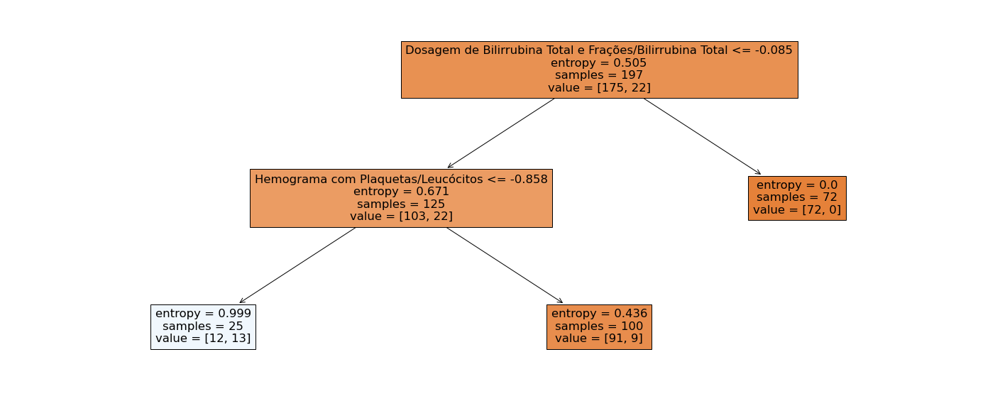

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

dtc = DecisionTreeClassifier(random_state=0, criterion='entropy', 
                             max_depth=2, 
                            min_samples_leaf=15
                             )
dtc.fit(Xtreino, ytreino)

yestimativa = dtc.predict(Xteste)
print(accuracy_score(yteste, yestimativa))

plt.rcParams['figure.figsize'] = (25, 10)
plot_tree(dtc, filled=True, 
          feature_names=['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos', 'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total']);

## 24.1 Verificando a importancia de cada coluna para arvore de decisão

In [ ]:
for nome, importancia in zip(dfFinal.columns, dtc.feature_importances_):
    print(f"{nome}: {importancia}")

PCR em tempo real para detecção de Coron/Resultado COVID-19:: 0.0
Hemograma com Plaquetas/CHCM: 0.0
Hemograma com Plaquetas/Hematócrito: 0.0
Hemograma com Plaquetas/Hemácias: 0.0
Hemograma com Plaquetas/Plaquetas: 0.0
Hemograma com Plaquetas/VCM: 0.0
Hemograma com Plaquetas/HCM: 0.0
Hemograma com Plaquetas/Hemoglobina: 0.49544803098100487
Hemograma com Plaquetas/Leucócitos: 0.0
Hemograma com Plaquetas/Leucócitos #: 0.0
Hemograma com Plaquetas/RDW: 0.0
Hemograma com Plaquetas/Volume Médio Plaquetário: 0.0
Dosagem de Uréia/Uréia: 0.0
Hemograma Contagem Auto/Linfócitos: 0.0
Hemograma Contagem Auto/Basófilos: 0.0
Hemograma Contagem Auto/Basófilos #: 0.0
Hemograma Contagem Auto/Eosinófilos: 0.0
Urina Tipo I/Aspecto: 0.0
Urina Tipo I/Açúcar: 0.0
Urina Tipo I/Cilindros granulosos: 0.0
Urina Tipo I/Cilindros hialinos: 0.0
Urina Tipo I/Cor: 0.0
Urina Tipo I/Corpos cetônicos: 0.0
Urina Tipo I/Densidade: 0.0
Urina Tipo I/Esterase: 0.0
Urina Tipo I/Hemoglobina Urina: 0.0
Urina Tipo I/Hemácias Urin

## 24.2 Encontrando o melhor valor

In [ ]:
acc_treino = {}
acc_teste = {}
for i in range(1,15):
    if i not in acc_treino:
        acc_treino[i] = []
        acc_teste[i] = []

    for j in range(0, 5):
        Xtreino, Xteste, ytreino, yteste = train_test_split(
                dfFinal[['Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos', 'Urina Tipo I/Aspecto',
'Urina Tipo I/Açúcar',
'Urina Tipo I/Cilindros granulosos',
'Urina Tipo I/Cilindros hialinos',
'Urina Tipo I/Cor',
'Urina Tipo I/Corpos cetônicos',
#'Urina Tipo I/Cristais',
'Urina Tipo I/Densidade',
'Urina Tipo I/Esterase',
'Urina Tipo I/Hemoglobina Urina',
'Urina Tipo I/Hemácias Urina',
'Urina Tipo I/Leucócitos Urina',
'Urina Tipo I/Leveduras',
'Urina Tipo I/Nitrito',
'Urina Tipo I/Pigmentos biliares',
'Urina Tipo I/Proteína',
'Urina Tipo I/Urobilinogênio',
'Urina Tipo I/pH',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Direta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Indireta',
'Dosagem de Bilirrubina Total e Frações/Bilirrubina Total']],
                dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], test_size=.30, 
                stratify=dfFinal['PCR em tempo real para detecção de Coron/Resultado COVID-19:'], random_state=j)
        
        dtc = DecisionTreeClassifier(max_depth=i, random_state=i, min_samples_leaf=5)
        dtc.fit(Xtreino, ytreino)

        ythat = accuracy_score(ytreino, dtc.predict(Xtreino))
        yest = accuracy_score(yteste, dtc.predict(Xteste))

        acc_treino[i].append(ythat)
        acc_teste[i].append(yest)

In [ ]:
df_tr = pd.DataFrame(acc_treino)
df_te = pd.DataFrame(acc_teste)

In [ ]:
melhor = max(df_te.mean())
medias = df_te.mean()
medias[medias==melhor]

3    0.778909
dtype: float64

# 25 Naive Bayes


Para esse modelo foi aplicado o dataset2

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

ColunasNaive = Xtreino
ClasseNaive = ytreino

clf = GaussianNB()
clf.fit(ColunasNaive, ClasseNaive)

print(clf.score(Xteste, yteste))



0.7326073805202662


# 26 Maquina Vetores de Suporte

Para esse modelo foi aplicado o dataset2

In [ ]:
import numpy as np
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFECV

X = Xtreino
y = ytreino
from sklearn.svm import SVC
#clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))

#clf = make_pipeline(StandardScaler(), SVC(gamma='auto', kernel="linear"))
#clf = RFECV(clf, step=1, cv=5)
#clf.fit(X, y)

estimator = SVC(kernel="linear")
selector = RFECV(estimator, step=1, cv=5)
selector = selector.fit(X, y)
clf = selector


print(clf.score(Xteste, yteste))

0.7973381730187538


In [ ]:
#print(dfexm6['Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr'].isna().sum())

# 27 Estudando os dados

## 28 Graficos

In [ ]:
#dfexm6["PCR em tempo real para detecção de Coron/Resultado COVID-19:"].hist()

for x in df2.columns:
  df2[x].hist()

Error in callback <function flush_figures at 0x7fed19efc0e0> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


df['Hemograma com Plaquetas/Hemoglobina'].hist()
dfexm6['Hemograma com Plaquetas/Volume Médio Plaquetário'].hist()

#for coluna in dfexm6.columns:
 #   plt.figure()
  #  sns.boxplot(data=dfexm6, x=coluna)

In [ ]:

plt.rcParams['figure.figsize'] = (15, 7)
dfexm6['Hemograma com Plaquetas/Hematócrito'].hist()


In [ ]:
dfexm6['Hemograma com Plaquetas/Hemácias'].hist()

In [ ]:
import seaborn as sns

sns.pairplot(data=dfexm6)

In [ ]:
corr = dfexm6.astype('float64').corr()

# 29 Juntando datasets de exame e dados do paciente

In [ ]:
import pandas as pd

dfpac = pd.read_csv("/content/drive/MyDrive/TCC/EINSTEIN_Pacientes_2.csv", sep='|')
dfpac.head()

In [ ]:
data2 = pd.read_csv("/content/drive/MyDrive/TCC/TESTE/DataSet2/UnificadoDataSet2.csv", sep=',')
data2 = data2[['ID_PACIENTE','DT_COLETA',
'PCR em tempo real para detecção de Coron/Resultado COVID-19:',
'Hemograma com Plaquetas/CHCM',
'Hemograma com Plaquetas/Hematócrito',
'Hemograma com Plaquetas/Hemácias',
'Hemograma com Plaquetas/Plaquetas',
'Hemograma com Plaquetas/VCM',
'Hemograma com Plaquetas/HCM',
'Hemograma com Plaquetas/Hemoglobina',
'Hemograma com Plaquetas/Leucócitos',
'Hemograma com Plaquetas/Leucócitos #',
'Hemograma com Plaquetas/RDW',
'Hemograma com Plaquetas/Volume Médio Plaquetário',
'Dosagem de Uréia/Uréia',
'Hemograma Contagem Auto/Linfócitos',
'Hemograma Contagem Auto/Basófilos',
'Hemograma Contagem Auto/Basófilos #', 
'Hemograma Contagem Auto/Eosinófilos']]
dfFinal = data2.copy()

In [ ]:
df = dfpac.join(dfFinal.set_index('ID_PACIENTE'), on='ID_PACIENTE')
df.shape

In [ ]:
df.head()

# 29.1 Pegando informação de um único paciente

In [ ]:
df[df['ID_PACIENTE'] == 'dd3867bd301ef64a20e8a4f62b661ecea83c3a64']

# 29.2 Organizando as informações

In [ ]:
df.head()

In [ ]:
df_agrupado = dfpac.groupby(by=['ID_PACIENTE']).apply(lambda x: list(x['DE_EXAME']))

df_agrupado.head()

In [ ]:
df_novo = pd.DataFrame(df_agrupado,index=None)
df_novo.reset_index(inplace=True)
df_novo.rename({0: 'exames'}, inplace=True, axis=1)
df_novo.head()

#Ignorar

Ignorar informações. Essas informações eram códigos que tinha utilizado em algum momento, mas não precisei mais utiliza-los ou realizei outro tratamento. Deixei as informações apenas para verificar algumas opções de tratamento que havia tentado utilizar.

In [ ]:
import numpy as np
import math
lista4 = []

contador =0
#dicionario com chave para cada coluna
#lista para cada chave
dicionario9 = dict_from_list2.copy()

#se nao der certo com np.nan, tentar usar isna()

for i, valor in df33.iterrows():
  
  #paciente que realizou exames em dois dias consecutivos. 128077 É O NUMERO MAXIMO QUE i PODE ASSUMIR DEVIDO i+1
  if i <= 2:
    d1 = datetime.strptime(df33.at[i, 'DT_COLETA'], '%d/%m/%Y').date()
    d2 = datetime.strptime(df33.at[i+1, 'DT_COLETA'], '%d/%m/%Y').date()
    quantidade_dias = abs((d2 - d1).days)

#tarefa fazer a media e adicionar no dicionario 6 para cada coluna

    #verificar se o paciente tem exames em dias seguidos e que esses exames pertencem ao mesmo paciente
    if quantidade_dias < 7 and df33.at[i, 'ID_PACIENTE'] == df33.at[i+1, 'ID_PACIENTE']:
      contador = i
    
      #PERCORRER TODAS AS COLUNAS     
      for x in df33.columns:
        if isinstance(valor[x], str):
          valor[x] = valor[x].strip()
        else: 
          if math.isnan(valor[x]) == False and math.isnan(df33.at[i+1, x]) == False:
            print('Qual coluna ', x)
            print('Valor da linha', i)
            print('Valor i+1', i+1)
            print('Valor da linha i', valor[x])
            print('Valor da linha i+1', df33.at[i+1, x])
              
            lista4.append((valor[x] + df33.at[i+1, x])/2)# = dicionario4['PCR em tempo real para detecção de Coron/Resultado COVID-19:'][len(dfexm7['PCR em tempo real para detecção de Coron/Resultado COVID-19:']):] = [valor['PCR em tempo real para detecção de Coron/Resultado COVID-19:']]       
              #dicionario2['exameespecifico'].append(#valor['EXAME'] = (valor['EXAME'] + dfexm7.at[i+1, 'EXAME'])/2
              #contador para quantidade de pacientes que tem mais de uma registro de exame em menos de 7 dias
      
                #print('Qual coluna ', x)
                #print('Valor i', i)
                #print('Qual o valor2', valor[x])
          
        print('Qual coluna X', x)
        print('Qual linha I', i)
        print('Valor da linha I', valor[x])
        lista4.append(valor[x])
  i += 1        
        #print('VALOR DICIO SEMCOD',  dicionario8[x][i])

Qual coluna X ID_PACIENTE
Qual linha I 0
Valor da linha I 1
Qual coluna X DT_COLETA
Qual linha I 0
Valor da linha I 30/08/2021
Qual coluna  URINA
Valor da linha 0
Valor i+1 1
Valor da linha i 11
Valor da linha i+1 20
Qual coluna X URINA
Qual linha I 0
Valor da linha I 11


In [ ]:
#datetime.strptime(dfexm6.reset_index().iloc[3]['DT_COLETA'], "%d/%m/%Y").strftime("%Y-%m-%d")

Agrupando os registros apenas por paciente
OBS: NÃO É INTERESSANTE ESSA ABORDAGEM, POIS PACIENTE PODE TER EXAMES EM DIFERENTES MESES, ASSIM OS DADOS FICARAM EM UM UNICO REGISTRO



In [ ]:
import numpy as np
dfexm7 = dfexm7.fillna(np.nan).groupby('ID_PACIENTE').first()



Verificar quantidade de dados faltantes após executar o código acima

In [ ]:
dicionario3 = {}
for i in dfexm7.columns:
  dicionario3[i] = dfexm7[i].isna().sum() / dfexm7.shape[0]
sorted(dicionario3.items(), reverse= False, key= lambda x: x[1]) 

[('DT_COLETA', 0.0),
 ('data', 0.0),
 ('PCR em tempo real para detecção de Coron/Resultado COVID-19:',
  2.50501002004008e-05),
 ('Hemograma com Plaquetas/Hematócrito', 0.723058617234469),
 ('Hemograma com Plaquetas/Hemoglobina', 0.723058617234469),
 ('Hemograma com Plaquetas/Hemácias', 0.723058617234469),
 ('Hemograma com Plaquetas/Leucócitos', 0.723058617234469),
 ('Hemograma com Plaquetas/Leucócitos #', 0.723058617234469),
 ('Hemograma com Plaquetas/Plaquetas', 0.723058617234469),
 ('Hemograma com Plaquetas/VCM', 0.723058617234469),
 ('Hemograma com Plaquetas/CHCM', 0.7230711422845691),
 ('Hemograma com Plaquetas/HCM', 0.7230711422845691),
 ('Hemograma com Plaquetas/RDW', 0.7232089178356713),
 ('Hemograma com Plaquetas/Volume Médio Plaquetário', 0.72437374749499),
 ('Hemograma Contagem Auto/Basófilos', 0.7359969939879759),
 ('Hemograma Contagem Auto/Eosinófilos', 0.7359969939879759),
 ('Hemograma Contagem Auto/Eosinófilos  #', 0.7359969939879759),
 ('Hemograma Contagem Auto/Linfócit

In [ ]:
dfexm7.loc['0001a3bacb771dfa63c6404725e9f98bf94b19ed']

EXAME
DT_COLETA                                                      04/02/2020
Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr             None
Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgG Interp             None
Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgA, COVID19:                None
Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgG, COVID19                 None
                                                                ...      
Urina Tipo I/Proteína                                       Não Detectado
Urina Tipo I/Urobilinogênio                                        Normal
Urina Tipo I/pH                                                       5.0
zzPesquisa de Pigmentos Biliares/Pigmentos biliares                  None
data                                                           04/02/2020
Name: 0001a3bacb771dfa63c6404725e9f98bf94b19ed, Length: 308, dtype: object

In [ ]:
 dfexm7.at[2, 'data']

'24/05/2020'

In [ ]:
#dfexm7['Hemograma Contagem Auto/Basófilos']
tes = dfexm7['Hemograma Contagem Auto/Basófilos']


pd.to_numeric(tes, errors='coerce')

0         0.7
1         NaN
2         NaN
3         NaN
4         NaN
         ... 
128079    NaN
128080    NaN
128081    0.7
128082    NaN
128083    NaN
Name: Hemograma Contagem Auto/Basófilos, Length: 128084, dtype: float64

In [ ]:
test3 = pd.to_numeric(dfexm7[i], errors='coerce')

In [ ]:
import numpy as np
import math

contador =0
#dicionario com chave para cada coluna
#lista para cada chave
dicionario8 = dict_from_list.copy()

#se nao der certo com np.nan, tentar usar isna()

for i, valor in dfexm7.iterrows():
  
  #paciente que realizou exames em dois dias consecutivos. 128077 É O NUMERO MAXIMO QUE i PODE ASSUMIR DEVIDO i+1
  if i <= 500:
    d1 = datetime.strptime(dfexm7.at[i, 'data'], '%d/%m/%Y').date()
    d2 = datetime.strptime(dfexm7.at[i+1, 'data'], '%d/%m/%Y').date()
    quantidade_dias = abs((d2 - d1).days)

#tarefa fazer a media e adicionar no dicionario 6 para cada coluna

    #verificar se o paciente tem exames em dias seguidos e que esses exames pertencem ao mesmo paciente
    if quantidade_dias < 7 and dfexm7.at[i, 'ID_PACIENTE'] == dfexm7.at[i+1, 'ID_PACIENTE']:
      contador = i
    
      #PERCORRER TODAS AS COLUNAS     
      for x in dfexm7.columns:
        if isinstance(valor[x], str):
          valor[x] = valor[x].strip()
        else: 
          if x == 'Hemograma Contagem Auto/Basófilos':
            if math.isnan(valor[x]) == False and math.isnan(dfexm7.at[i+1, x]) == False:
              print('Qual coluna ', x)
              print('Valor da linha', i)
              print('Valor i+1', i+1)
              print('Valor da linha i', valor[x])
              print('Valor da linha i+1', dfexm7.at[i+1, x])
              
              dicionario8[x].append((valor[x] + dfexm7.at[i+1, x])/2)# = dicionario4['PCR em tempo real para detecção de Coron/Resultado COVID-19:'][len(dfexm7['PCR em tempo real para detecção de Coron/Resultado COVID-19:']):] = [valor['PCR em tempo real para detecção de Coron/Resultado COVID-19:']]       
              if dicionario8[x][i] != np.nan:
                print('VALOR DICIO',  dicionario8[x][i])
              i +=1
              #dicionario2['exameespecifico'].append(#valor['EXAME'] = (valor['EXAME'] + dfexm7.at[i+1, 'EXAME'])/2
              #contador para quantidade de pacientes que tem mais de uma registro de exame em menos de 7 dias
      
                #print('Qual coluna ', x)
                #print('Valor i', i)
                #print('Qual o valor2', valor[x])
        if x == 'Hemograma Contagem Auto/Basófilos':
          print('Qual coluna X', x)
          print('Qual linha I', i)
          print('Valor da linha I', valor[x])
          dicionario8[x].append(valor[x])
        #print('VALOR DICIO SEMCOD',  dicionario8[x][i])

In [ ]:
df33 = pd.DataFrame({'ID_PACIENTE': ['1', '1', '2', '2', '3', '4'],
                   'DT_COLETA': ['30/08/2021', '31/08/2021', '04/09/2021', '20/09/2021', '04/09/2021', '20/09/2021'],
                   'URINA': [11, 20, 150, 200, 50, 60]})



In [ ]:
for i in df33.columns:
  nomeColunas.append(i)
  valorChave.append(valorChave2)
  if(i != 'DT_COLETA' and i != 'ID_PACIENTE'):
    #https://stackoverflow.com/questions/15891038/change-column-type-in-pandas
    dfexm7[i] = pd.to_numeric(df33[i], errors='coerce')
dict_from_list2 = {nomeColunas[i]: valorChave[i] for i in range(len(nomeColunas))}
print(dict_from_list2)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



AINDA NAO ESTOU USANDO A LINHA ABAIXO, CASO VENHA USAR É NECESSÁRIO TIRAR 

 datetime.strptime(first, '%d/%m/%Y') E DEIXAR APENAS first

In [ ]:
df['DT_COLETA'] = pd.to_datetime(df['DT_COLETA'], format='%d/%m/%Y')

In [ ]:
import math

def checkConsecutiveDays(first, second):
  date1 = datetime.strptime(first, '%Y/%m/%d')
  date2 = datetime.strptime(second, '%Y/%m/%d')
  if (date2 - date1).days < 4:
    return True
  return False

def verificaPaciente(firt, second):
  return firt == second 

exc = []
for i, valor in df.iterrows():
  print('Valor de i ', i)
  if i < (len(df) - 1): 
    if (checkConsecutiveDays(df.at[i, 'DT_COLETA'], df.at[i+1, 'DT_COLETA']) and verificaPaciente(df.at[i, 'ID_PACIENTE'], df.at[i+1, 'ID_PACIENTE'])):
      for col in df.columns:
        if col ==  'DT_COLETA' or  col == 'data':continue
        if not isinstance(df.at[i, col], str):
          if (pd.isna(df.at[i, col])) ^ pd.isna(df.at[i+1, col]):
            df.at[i, col] = df.at[i+1, col] if pd.isna(df.at[i, col]) else df.at[i, col]
          else:
            df.at[i, col] = (df.at[i, col] + df.at[i+1, col]) / 2
          exc.append(i+1)


print(exc)
df = df.drop(exc)
 

Valor de i  0
Valor de i  1
Valor de i  2
Valor de i  3
Valor de i  4
Valor de i  5
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


In [ ]:
import math
import numpy as np


def checkConsecutiveDays(first, second):
  date1 = first#datetime.strptime(first, '%d/%m/%Y')
  date2 = second#datetime.strptime(second, '%d/%m/%Y')
  if (date2 - date1).days < 4:
    return True
  return False

def verificaPaciente(firt, second):
  return firt == second 

exc = []
for i, valor in df.iterrows():
  print('Valor de i ', i)
  if i < (len(df) - 1): 
    if (checkConsecutiveDays(df.at[i, 'DT_COLETA'], df.at[i+1, 'DT_COLETA']) and verificaPaciente(df.at[i, 'ID_PACIENTE'], df.at[i+1, 'ID_PACIENTE'])):
      for col in df.columns:
        print((df.at[i, col] == np.nan))
        if col ==  'DT_COLETA' or  col == 'data':continue
        if not isinstance(df.at[i, col], str):
          #if (pd.isna(df.at[i, col])) ^ pd.isna(df.at[i+1, col]):
          #  df.at[i, col] = df.at[i+1, col] if pd.isna(df.at[i, col]) else df.at[i, col]
          if pd.isna(df.at[i, col]) and pd.isna(df.at[i+1, col]):continue
          if pd.isna(df.at[i, col]) == True and pd.isna(df.at[i+1, col]) == False:
            df.at[i, col] = df.at[i+1, col]  
            exc.append(i+1)
          elif  pd.isna(df.at[i, col] == False) and pd.isna(df.at[i+1, col]) == True:
            df.at[i, col] = df.at[i, col]  
            exc.append(i+1)      
          else:
            df.at[i, col] = (df.at[i, col] + df.at[i+1, col]) / 2
          exc.append(i+1)


print(exc)
df = df.drop(exc)
 

Valor de i  0
False
False
False
False
Valor de i  1
False
False
False
False
Valor de i  2
Valor de i  3
[]


In [ ]:
nomeColunas = []
valorChave = []
valorChave2 = []


for i in dfexm7.columns:
  nomeColunas.append(i)
  valorChave.append(valorChave2)
  if(i != 'data' and i != 'ID_PACIENTE'):
    #https://stackoverflow.com/questions/15891038/change-column-type-in-pandas
    dfexm7[i] = pd.to_numeric(dfexm7[i], errors='coerce')
    pass
dict_from_list = {nomeColunas[i]: valorChave[i] for i in range(len(nomeColunas))}
print(dict_from_list)

dicionario4 = dict_from_list


{'ID_PACIENTE': [], 'DT_COLETA': [], 'Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr': [], 'Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgG Interp': [], 'Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgA, COVID19:': [], 'Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgG, COVID19': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/BE (gasometria arterial)': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/CO2 Total (gasometria arterial)': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Cálcio Iônico mmol/L': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Dosagem de Glicose': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Fio2 Arterial': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/HCO3 (gasometria arterial)': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hematócrito': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hemoglobina': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Potássio': [], 'Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Saturação da Hb (gasometria arterial)': [], 'Cirúrgico :GAA,Hb,Ht,Na,

In [ ]:
dfexm7.sort_values(by= ['ID_PACIENTE', 'data'])

EXAME,ID_PACIENTE,DT_COLETA,Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgA Intepr,Anticorpos IgA e IgG SARS-CoV-2/COVID19/COVID IgG Interp,"Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgA, COVID19:","Anticorpos IgA e IgG SARS-CoV-2/COVID19/IgG, COVID19","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/BE (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/CO2 Total (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Cálcio Iônico mmol/L","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Dosagem de Glicose","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Fio2 Arterial","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/HCO3 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hematócrito","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Hemoglobina","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Potássio","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Saturação da Hb (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Sódio","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/ctO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pCO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pH (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/pO2 (gasometria arterial)","Cirúrgico :GAA,Hb,Ht,Na,K,Glic,CA++,Lact/Ácido Lático Arterial",Clearance de Creatinina/Creatinina,Clearance de Uréia/Uréia,Contagem de Hemácias/Hemácias,Contagem de Plaquetas/Plaquetas,Contagem de Plaquetas/Volume Médio Plaquetário,Contagem dos Reticulócitos/Hematócrito,Contagem dos Reticulócitos/Hemácias,Densidade Urinária/Densidade,Determinação de Osmolalidade/Dosagem de Glicose,Determinação de Osmolalidade/Sódio,Determinação de Osmolalidade/Uréia,Diferencial Manual/Bastonestes,Diferencial Manual/Bastonetes #,Diferencial Manual/Basófilos,Diferencial Manual/Basófilos #,Diferencial Manual/Eosinófilos,Diferencial Manual/Eosinófilos #,Diferencial Manual/Linfócitos,...,"Sorologia SARS-CoV-2/COVID19 IgG/IgM/IgG, COVID19","Sorologia SARS-CoV-2/COVID19 IgG/IgM/IgM, COVID19",TP POCT/RNI,TTPA/Relação (Paciente/Normal),TTPA/TTPA segundos,Tempo de Protrombina/RNI,"Tempo de Protrombina/TP, Atividade","Teste rápido Coronavirus COVID19 IgG/IgM/COVID19 IgG, teste rápido","Teste rápido Coronavirus COVID19 IgG/IgM/COVID19 IgM, teste rápido",Triagem de Urina/Aspecto,Triagem de Urina/Açúcar,Triagem de Urina/Corpos cetônicos,Triagem de Urina/Densidade,Triagem de Urina/Esterase,Triagem de Urina/Hemoglobina Urina,Triagem de Urina/Nitrito,Triagem de Urina/Pigmentos biliares,Triagem de Urina/Proteína,Triagem de Urina/Urobilinogênio,Triagem de Urina/pH,Urina Tipo I/Aspecto,Urina Tipo I/Açúcar,Urina Tipo I/Cilindros granulosos,Urina Tipo I/Cilindros hialinos,Urina Tipo I/Cor,Urina Tipo I/Corpos cetônicos,Urina Tipo I/Cristais,Urina Tipo I/Densidade,Urina Tipo I/Esterase,Urina Tipo I/Hemoglobina Urina,Urina Tipo I/Hemácias Urina,Urina Tipo I/Leucócitos Urina,Urina Tipo I/Leveduras,Urina Tipo I/Nitrito,Urina Tipo I/Pigmentos biliares,Urina Tipo I/Proteína,Urina Tipo I/Urobilinogênio,Urina Tipo I/pH,zzPesquisa de Pigmentos Biliares/Pigmentos biliares,data
0,00006490d57666d73747c29c01079b60b1353002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,04/06/2020
1,00006490d57666d73747c29c01079b60b1353002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,05/06/2020
2,00006490d57666d73747c29c01079b60b1353002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [ ]:
#dfexm6['DT_COLETA'].iloc[0]
#datetime.strptime(dfexm6.iloc[0]['DT_COLETA'], "%d/%m/%Y").strftime("%Y-%m-%d")

In [ ]:
#from datetime import datetime

#dfexm6['DT_COLETA'].unique()
#dfexm6['DT_COLETA'] = datetime.strptime(dfexm6.reset_index()['DT_COLETA'], "%d/%m/%Y")

#variavel = dfexm6.reset_index()['DT_COLETA']
#dfexm6['data'] = variavel.apply(lambda x: datetime.strptime(x, "%d/%m/%Y").strftime("%Y-%m-%d"))
#dfexm6